## <a name="0.0"></a>Contents:
* [0. Project and Data description, downloading and importing libraries](#0.)
* [1. Loading ang review of the data:](#1.)
     - [1.1. Table visits](#1.1.)
     - [1.2. Table orders](#1.2.)
     - [1.3. Table costs](#1.3.)
* [2. Product Data Analysis (DAU, WAU, MAU, Retention)](#2.)
     - [2.1. Data preparation](#2.1.)
     - [2.2. Visualisation](#2.2.)
     - [2.3. Conclusion](#2.3.)
     - [2.4. Retention Heatmap (relative and absolute values)](#2.4.)
* [3. Sales Data Analysis](#3.)
     - [3.1. When people start buying](#3.1.)
     - [3.2. Orders per period](#3.2.)
     - [3.3. Average order check](#3.3.)
     - [3.4. LTV](#3.4.)
       + [3.4.1. Heatmap LTV (margin_rate = 0.5)](#3.4.1.)
       + [3.4.2. Heatmap LTV (margin_rate = 1)](#3.4.2.)
* [4. Marketing Data Analysis](#4.)
     - [4.1. Money spent (total, per source, within time)<br/>
How much does it cost to attract one buyer from each source?<br/>](#4.1.)
       + [4.1.1. Graph of the relationship between costs and revenues](#4.1.1.)
       + [4.1.2. Monthly revenue (showing the impact of each cohort)](#4.1.2.)
       + [4.1.3. Advertising Costs by time](#4.1.3.)
       + [4.1.4. Advertising Costs per source](#4.1.4.)
       + [4.1.5. Number of attracted users by advertising sources](#4.1.5.)
       + [4.1.6. Revenue by ad sources](#4.1.6.)
       + [4.1.7. Costs, revenue, and number of attracted users by advertising sources](#4.1.7.)
       + [4.1.8. How much does is cost to attract one buyer from each source?](#4.1.8.)
       + [4.1.9. Conclusions on the profitability of using each advertising source](#4.1.9.)
     - [4.2. Resource attendance analysis by device type](#4.2.)
     - [4.3. CAC, ROMI](#4.3.)
       + [4.3.1. Functions to plot heatmap and stacked-bar](#4.3.1.)     
       + [4.3.2. ROMI (margin_rate = 0.5)](#4.3.2.)         
       + [4.3.3. ROMI (margin_rate = 1)](#4.3.3.)
* [5. General conclusion](#5.)

# Project Description<a name="0."></a>
<font size="2">([to the contents](#0.0))</font><br/>

You were invited to an internship in the <b>J.K.</b> analytics department (<b>J.K.</b> is a ticket aggregator). The first task you should complete is to help marketers with optimizing marketing costs.

You're provided with all needed data from <b>J.K.</b> This data describes activity within the period from June 2017 to the end of May 2018:
* server log with data on J.K. site visits;
* data with all orders for this period;
* statistics on advertising costs.

# Data Description
<font size="2">([to the contents](#0.0))</font><br/>

Table <b>"visits"</b> (server log with data on J.A. site visits;):
* <b>Uid</b> — user's unique id;
* <b>Device</b> — user's device type;
* <b>Start Ts</b> — start of session (date and time);
* <b>End Ts</b> — end of session (date and time);
* <b>Source Id</b> — advertisement source id, from which user came.

Table <b>"orders"</b> (information about orders):
* <b>Uid</b> — buyer's unique id;
* <b>Buy Ts</b> — order date and time;
* <b>Revenue</b> — revenue from order.

Table <b>"costs"</b> (information about advertising costs):
* <b>source_id</b> — advertisement source id;
* <b>dt</b> — date;
* <b>costs</b> — this day costs of ad source.

# Downloading libraries
<font size="2">([to the contents](#0.0))</font><br/>

In [1]:
!pip install bokeh

In [2]:
!pip install pandas-bokeh

In [3]:
!pip install hvplot

# Importing libraries
<font size="2">([to the contents](#0.0))</font><br/>

Loading BokehJS ...

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
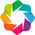

In [80]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import datetime
import decimal
from PIL import Image

from bokeh.models.widgets import DataTable, DateFormatter, TableColumn, RadioButtonGroup, Select
from bokeh.plotting import ColumnDataSource, figure, show
from bokeh.io import output_file, reset_output, output_notebook
from bokeh.models.widgets import Tabs, Panel, Div
from bokeh.models import Span, Range1d, CustomJS, TextInput, HoverTool, FactorRange
from bokeh.models import WheelZoomTool, NumeralTickFormatter, Legend, BoxAnnotation
from bokeh.layouts import layout, row, column, widgetbox, gridplot
from bokeh.models import SingleIntervalTicker, LinearAxis, Label, Span, CheckboxGroup
from bokeh.transform import dodge
output_notebook()

%matplotlib inline

import seaborn as sns
import holoviews as hv
from holoviews import dim, opts
hv.extension('bokeh')

import warnings
warnings.filterwarnings('ignore')

<a name="1."></a><br/>
<font size="5"><b>1. Loading ang review of the data:</b></font>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

In [5]:
visits = pd.read_csv('/datasets/visits_log.csv')
orders = pd.read_csv('/datasets/orders_log.csv')
costs = pd.read_csv('/datasets/costs.csv')

Let's view info about each table (a table itself, NaNs, types and description of columns).<br/>
Function for this:

In [6]:
def create_bokeh_report(df, df_name='df', missingno=True, advice=True, 
                        table_width=500, table_height = 400, show_zeros=True):
    reset_output()
    output_notebook()

    df_height = df.shape[0]
    df_width = df.shape[1]
    
    if df_height > 30000:
        df = df[:30000]

    z = df.notnull().values
    g = np.zeros((df.shape[0], df.shape[1], 3))

    color = (1,1,1) # black

    g[z < 0.5] = [255, 255, 255]
    g[z > 0.5] = color

    xdim, ydim = df.shape[1], df.shape[0]
    img = np.empty((ydim, xdim), dtype=np.uint32)
    view = img.view(dtype=np.uint8).reshape((ydim, xdim, 4))
    view[:,:,0] = g[:,:,0] # copy red channel
    view[:,:,1] = g[:,:,1] # copy blue channel
    view[:,:,2] = g[:,:,2] # copy green channel
    view[:,:,3] = 255 # Alpha
    
    img = img[::-1]
    NaNs = figure(title="NaNs count, %", x_range=(-2,1.2*xdim), y_range=(-ydim*0.2,1.3*ydim), 
                  width=table_width, height=400, tools='pan, wheel_zoom, reset')
    NaNs.image_rgba(image=[img], x=0, y=0, dw=xdim, dh=ydim)
    i_columns = 0.4
    for label in df.columns:
        label1, label2 = label, label
        count_nulls_perc = df[label].count()/len(df)
        if len(label1) > 15:
            text_label1_font_size = '8pt'
        elif len(label1) > 10:
            text_label1_font_size = '9pt'
        else:
            text_label1_font_size = '11pt'

        label1 = Label(x=[i_columns, i_columns + 0.1][len(label1)<7], y=[ydim*1.01, ydim*1.03][len(label1)<7], 
                       text=label1, text_font_size=text_label1_font_size, angle=3/4)
        NaNs.add_layout(label1)
        if show_zeros:
            label2 = Label(x=i_columns, y=-ydim*0.15, text='{:.2%}'.format(1-count_nulls_perc), 
                           text_font_size='10pt', angle=3/4)
            NaNs.add_layout(label2)
        elif 1-count_nulls_perc > 0:
            label2 = Label(x=i_columns, y=-ydim*0.15, text='{:.2%}'.format(1-count_nulls_perc), 
                           text_font_size='10pt', angle=3/4)
            NaNs.add_layout(label2)
        i_columns += 1
        
    y_min_label = Label(x=-0.1*xdim, y=-ydim*0.01, text='1', text_font_size='10pt')
    NaNs.add_layout(y_min_label)
    y_max_label = Label(x=-0.1*xdim-len(str(df_height))/25, y=ydim*1.01, text='{}'.format(df_height), 
                        text_font_size='10pt')
    NaNs.add_layout(y_max_label)
    
    # vertical white lines to separate columns from each other
    for column_count in range(1, len(df.columns)):
        line = NaNs.line([column_count, column_count], [0, ydim], color='white')
        NaNs.add_layout(line)
    
    NaNs.xaxis.visible = None
    NaNs.yaxis.visible = None
    NaNs.xgrid.grid_line_color = None
    NaNs.ygrid.grid_line_color = None
    NaNs.outline_line_alpha = 0 
    
    # selection of view of a dataframe
    
    mask = df.isnull().any(axis=1)
    df_NaNs = df[mask][:30]
    df_no_NaNs = df[~mask][30:60]
    source_df = ColumnDataSource(data=df.sample(30))
    source_NaNs = ColumnDataSource(data=df_NaNs)
    source_no_NaNs = ColumnDataSource(data=df_no_NaNs)
    source_full_df = ColumnDataSource(data=df)
    source_fill = ColumnDataSource(data=df.sample(30))
    
    select = Select(title='Dataframe to show:', value='Sample(30)', 
                    options=["Sample(30)", "Rows with NaNs", "Rows w/o NaNs", "Full_df"], width=150)
    
    update = CustomJS(args=dict(source_fill=source_fill, source_df=source_df, source_NaNs=source_NaNs,
        source_no_NaNs=source_no_NaNs, source_full_df=source_full_df), code="""

    var f = cb_obj.value;

    if (f == 'Sample(30)') {
        source_fill.data = source_df.data;
    }
    if (f == 'Rows with NaNs') {
        source_fill.data = source_NaNs.data;
    }
    if (f == 'Rows w/o NaNs') {
        source_fill.data = source_no_NaNs.data;
    }
    if (f == 'Full_df') {
        source_fill.data = source_full_df.data;
    }

    source_fill.change.emit();
    """)
    
    select.js_on_change('value', update)
    
    div_common = Div(text="""DataFrame <b>"{dfname}"</b> consists of <b>{shape0} rows</b> and <b>{shape1} columns</b>.<br/>
                      It has <b>{NaNs} NaNs</b>.""".format(dfname = df_name, shape0 = df_height, shape1 = df_width,
                                                   NaNs = df.isnull().sum().sum()),
    width=200, height=100)
    
    df_describe = df.describe(include='all')
    df_describe = df_describe.fillna('')
    df_describe = df_describe.drop(['count', 'top', 'freq'], axis=0)
    curr_rows = df_describe.index.values
    df_describe.loc['type', :] = 1
    df_describe.loc['NaNs, %', :] = 1
    for column_count in range(len(df_describe.columns)):
        df_describe.iloc[-2, column_count] = df.iloc[:,column_count].dtype.name
        df_describe.iloc[-1, column_count] = '{:.2f}'.format(1 - len(df.iloc[:,column_count])/
                                                             df.iloc[:,column_count].count())

    df_describe = df_describe.reindex([df_describe.index.values[-2], df_describe.index.values[-1], *curr_rows])
    
    div_info = Div(text="""{dfinfo}""".format(dfinfo = df_describe.to_html()),
    width=200, height=100)

    radio_button_group = RadioButtonGroup(labels=["Sample(30)", "Rows with NaNs", "Rows w/o NaNs", "Full_df"], active=1)
    radio_button_group.js_on_change('active', update)
    
    Columns = [TableColumn(field=column, title=column) for column in df.columns]
    data_table = DataTable(columns=Columns, source=source_fill, width=table_width, height=table_height,
                           selectable=False) 
    
    # widget for text_info
    widgets_layout = column(Div(), row(Div(), div_common, spacing=-160), spacing=85)
    
    # histograms
    int_columns = df._get_numeric_data().columns.to_list()
    hists = ['hist' + str(x+1) for x in range(len(int_columns))]
    hists_for_layout = []
    for i in range(len(int_columns)):
        series_to_plot = df[int_columns[i]]
        measured = series_to_plot.values
        hist, edges = np.histogram(measured, density=True, bins=100)
        hists[i] = figure(title='Histogram of {}'.format(int_columns[i]), plot_width = 400, plot_height=300,
                          tools='pan, zoom_in, reset', background_fill_color="#fafafa")
        hists[i].quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
           fill_color="navy", line_color="white", alpha=0.5)
        hists[i].y_range.start = 0
        hists[i].xaxis.axis_label = 'x'
        hists[i].yaxis.axis_label = 'Pr(x)'
        hists[i].grid.grid_line_color="white"
        right = series_to_plot.quantile(0.99)
        hists[i].x_range=Range1d(0, right)
        hists_for_layout.append(hists[i])
    
    l1 = layout([[data_table, select, widgets_layout]])
    l2 = layout([[NaNs]])
    l3 = layout([[div_info]])            
    l4 = layout([[*hists_for_layout]])
    
    tab1 = Panel(child=l1, title=df_name)
    tab2 = Panel(child=l2, title='NaNs')
    tab3 = Panel(child=l3, title='Info')
    tab4 = Panel(child=l4, title='Histograms')
    
    tabs = Tabs(tabs=[tab1, tab2, tab3, tab4])

    show(row(tabs))

<a name="1.1."></a><br/>
<b>1.1. Table visits:</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

In [7]:
visits = visits.rename(columns={'End Ts': 'session_end', 'Start Ts': 'session_start'})
visits.columns = visits.columns.str.lower()

create_bokeh_report(visits, 'visits')

Loading BokehJS ...

Columns <b>session_start</b> и <b>session_end</b> have type <b>object</b>, but in fact there we have date and time. Changing type in them:

In [8]:
visits['session_start'] = pd.to_datetime(visits['session_start'])
visits['session_end'] = pd.to_datetime(visits['session_end'])

<a name="1.2."></a><br/>
<b>1.2. Table orders:</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

In [9]:
orders = orders.rename(columns={'Buy Ts': 'date_of_purchase'})
orders.columns = orders.columns.str.lower()

create_bokeh_report(orders, 'orders')

Loading BokehJS ...

Column <b>date_of_purchase</b> has type <b>object</b> too, but there's date and time. Changing its format:

In [10]:
orders['date_of_purchase'] = pd.to_datetime(orders['date_of_purchase'])

Column <b>revenue</b> doesn't contain info about on units of values. Let's assume that it's <b>"thousands rubles"</b>(K rbl.), given  the values are there. We will use this notation further.

<a name="1.3."></a><br/>
<b>1.3. Table costs:</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

In [11]:
costs = costs.rename(columns={'dt': 'date'})
costs.columns = costs.columns.str.lower()

create_bokeh_report(costs, 'costs')

Loading BokehJS ...

Column <b>date</b> has type <b>object</b>. To <b>datetime</b> format:

In [12]:
costs['date'] = pd.to_datetime(costs['date'], format='%Y-%m-%d')

Columns <b>revenue</b> (in table orders) and <b>costs</b> (in table costs) don't contain info about on units of values. Let's assume that it's <b>"thousands rubles"</b>(K rbl.), given  the values are there. We will use this notation further.

<hr style="border: 1px solid #000;">

<a name="2."></a><br/>
<font size="5"><b>2. Product Data Analysis (DAU, WAU, MAU, Retention)</b></font>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>
* 2.1. Users per day, per week, per month
* 2.2. Number of sessions per day
* 2.3. Duration of session
* 2.4. How often people come back

<br/>
We'll work with dataFrame <b>visits</b>.

In [13]:
visits.head(10)

,device,session_end,source id,session_start,uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451
7,touch,2017-11-05 15:15:00,3,2017-11-05 15:14:00,11423865690854540312
8,desktop,2017-07-19 10:44:00,3,2017-07-19 10:41:00,2987360259350925644
9,desktop,2017-11-08 13:43:00,5,2017-11-08 13:42:00,1289240080042562063


<a name="2.1."></a><br/>
<b>2.1. Data Preparation:</b><br/>
<font size="2">([to the contents](#0.0))</font><br/>

To answer questions we should add columns with day of session, its number of week and month. Also let's add column with session duration (in minutes):

In [14]:
visits['session_umd'] = visits['session_start'].dt.date
visits['session_week'] = visits['session_start'].dt.week
visits['session_month'] = visits['session_start'].dt.to_period('M')
visits['session_duration'] = visits['session_end'] - visits['session_start']
visits['session_duration'] = visits['session_duration'].apply(lambda x: decimal.Decimal(x.seconds) // 60)
visits['session_duration'] = visits['session_duration'].astype('int')

In [15]:
visits.head(10)

,device,session_end,source id,session_start,uid,session_umd,session_week,session_month,session_duration
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20,51,2017-12,18
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19,8,2018-02,28
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01,26,2017-07,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-05-20,20,2018-05,24
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27,52,2017-12,0
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017-09-03,35,2017-09,1
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,2018-01-30,5,2018-01,56
7,touch,2017-11-05 15:15:00,3,2017-11-05 15:14:00,11423865690854540312,2017-11-05,44,2017-11,1
8,desktop,2017-07-19 10:44:00,3,2017-07-19 10:41:00,2987360259350925644,2017-07-19,29,2017-07,3
9,desktop,2017-11-08 13:43:00,5,2017-11-08 13:42:00,1289240080042562063,2017-11-08,45,2017-11,1


DataFrame is ready.

Now let's visualise daily, weekly and monthly visits, let's calculate our DAU, WAU and MAU, check average session duration.<br/>
We also add the ability to monitor daily revenue, costs, profits, the number of completed orders and the average check.

Creating universal function for this:

In [146]:
def bokeh_visits_count_plot(df, orders_df=orders, costs_df=costs,
                            common_datetime_column='session_start',
                            day_column='session_umd', 
                            week_column='session_week',
                            month_column='session_month',
                            orders_column='date_of_purchase',
                            count_column='uid',
                            revenue_column='revenue',
                            costs_groupby_column='date',
                            source_column='source_id',
                            costs_column='costs',
                            session_duration_column='session_duration',
                            show_ret_heatmap=True, active_tab=0,
                            tabs_to_show="all",
                            plot_width=810, plot_height=400):
    
    df = df.copy()
    
    #------------------------------------------------------------------------------------------------------------
    
    # DAU + visits_count
    df_to_plot_DAU = df.groupby(day_column)[count_column].nunique().reset_index()
    df_to_plot_visits_count_day = df.groupby(day_column)[count_column].count().reset_index()
    source_DAU = ColumnDataSource(df_to_plot_DAU)
    source_visits_count_day = ColumnDataSource(df_to_plot_visits_count_day)
    fig_DAU = figure(x_axis_type='datetime', plot_width=plot_width, plot_height=plot_height, 
                     title='DAU + daily visits', y_axis_label='Visitors')
    plot_DAU = fig_DAU.line(day_column, y=count_column, source=source_DAU, line_width=2, legend_label="DAU")
    mean_DAU = int(round(df_to_plot_DAU[count_column].mean(),0))
    mean_line_DAU = fig_DAU.line(x=[df_to_plot_DAU[day_column].min(), df_to_plot_DAU[day_column].max()], 
                         y=[mean_DAU, mean_DAU], legend_label='DAU avg',
                         line_dash = 'dashed', line_color='green', line_width=2)
    all_visits_line_day = fig_DAU.line(day_column, y=count_column, source=source_visits_count_day, 
                                       line_width=2, color='black', legend_label="Daily visits", line_alpha=0.3)
    mean_all_visits_day = int(df_to_plot_visits_count_day[count_column].mean())
    mean_line_all_visits_day = fig_DAU.line(x=[df_to_plot_visits_count_day[day_column].min(),
                                           df_to_plot_visits_count_day[day_column].max()], 
                         y=[mean_all_visits_day, mean_all_visits_day], legend_label='Daily visits avg',
                         line_dash = 'dashed', line_color='red', line_width=2)
    fig_DAU.legend.location = "top_left"
    fig_DAU.add_tools(HoverTool(renderers=[plot_DAU],
                          tooltips=[("Date", "@{"+day_column+"}{%F}"), 
                                    ("Number of unique ids", "@{"+count_column+"}")],
                          formatters={day_column: 'datetime'})) 
    fig_DAU.add_tools(HoverTool(renderers=[mean_line_DAU],
                          tooltips=[("Avg number of unique ids per day", "@y")]))
    fig_DAU.add_tools(HoverTool(renderers=[all_visits_line_day],
                          tooltips=[("Date", "@{"+day_column+"}{%F}"), 
                                    ("Number of visits", "@{"+count_column+"}")],
                          formatters={day_column: 'datetime'}))  
    fig_DAU.add_tools(HoverTool(renderers=[mean_line_all_visits_day],
                          tooltips=[("Avg number of visits per day", "@y")]))
    fig_DAU.y_range.start = 0
    fig_DAU.xaxis.major_label_orientation = 1
    fig_DAU.xgrid.grid_line_color = None
    fig_DAU.xaxis[0].ticker.desired_num_ticks = 15
    fig_DAU.toolbar.active_scroll = fig_DAU.select_one(WheelZoomTool)
    fig_DAU.xaxis.major_label_text_font_size = "10pt"
    fig_DAU.yaxis.major_label_text_font_size = "10pt"
    
    checkbox_DAU = CheckboxGroup(labels=["DAU", "Daily visits"],
                         active=[0,1], width=100)
    
    checkbox_DAU.callback = CustomJS(args=dict(line0=plot_DAU, line1=all_visits_line_day,
                                               line01=mean_line_DAU, line11=mean_line_all_visits_day), code="""
    //console.log(cb_obj.active);
    line0.visible = false;
    line01.visible = false;
    line1.visible = false;
    line11.visible = false;
    for (i in cb_obj.active) {
        //console.log(cb_obj.active[i]);
        if (cb_obj.active[i] == 0) {
            line0.visible = true;
            line01.visible = true;
        } else if (cb_obj.active[i] == 1) {
            line1.visible = true;
            line11.visible = true;
        }
    }
    """)
    
    #------------------------------------------------------------------------------------------------------------
    
    #WAU
    df_to_plot_WAU = (df[[common_datetime_column, count_column]]
                      .set_index(common_datetime_column)
                      .resample('W-MON')
                      .nunique()
                      .reset_index()
                      .rename(columns={common_datetime_column: week_column})
                     )
    df_to_plot_visits_count_week = (df[[common_datetime_column, count_column]]
                      .set_index(common_datetime_column)
                      .resample('W-MON')
                      .count()
                      .reset_index()
                      .rename(columns={common_datetime_column: week_column})
                     )
    source_WAU = ColumnDataSource(df_to_plot_WAU)
    source_visits_count_week = ColumnDataSource(df_to_plot_visits_count_week)
    fig_WAU = figure(x_axis_type='datetime', plot_width=plot_width, plot_height=plot_height,
                     x_range=[df_to_plot_WAU[week_column].min()-datetime.timedelta(days=14),
                              df_to_plot_WAU[week_column].max()+datetime.timedelta(days=14)],
                     title='WAU', y_axis_label='Visitors')
    plot_WAU = fig_WAU.line(week_column, y=count_column, source=source_WAU, line_width=2, legend_label="WAU")
    circles_WAU = fig_WAU.circle(week_column, y=count_column, source=source_WAU)
    mean_WAU = int(round(df_to_plot_WAU[count_column].mean(), 0))
    mean_line_WAU = fig_WAU.line(x=[df_to_plot_WAU[week_column].min(), df_to_plot_WAU[week_column].max()], 
                         y=[mean_WAU, mean_WAU], legend_label='WAU avg',
                         line_dash = 'dashed', line_color='green', line_width=2)
    all_visits_line_week = fig_WAU.line(week_column, y=count_column, 
                                        source=source_visits_count_week, line_width=2, 
                                        color='black', legend_label="Weekly visits", line_alpha=0.3)
    mean_all_visits_week = int(df_to_plot_visits_count_week[count_column].mean())
    mean_line_all_visits_week = fig_WAU.line(x=[df_to_plot_visits_count_week[week_column].min(),
                                                df_to_plot_visits_count_week[week_column].max()], 
                         y=[mean_all_visits_week, mean_all_visits_week], legend_label='Weekly visits avg',
                         line_dash = 'dashed', line_color='red', line_width=2)
    fig_WAU.legend.background_fill_alpha = 0.1
    fig_WAU.legend.location = "top_left"
    fig_WAU.add_tools(HoverTool(renderers=[plot_WAU],
                          tooltips=[("Date", "@{"+week_column+"}{%F}"), 
                                    ("Number of unique ids", "@{"+count_column+"}")],
                          formatters={week_column: 'datetime'}))
    fig_WAU.add_tools(HoverTool(renderers=[mean_line_WAU],
                          tooltips=[("Avg number of unique ids per week", "@y")]))
    fig_WAU.add_tools(HoverTool(renderers=[all_visits_line_week],
                          tooltips=[("Date", "@{"+week_column+"}{%F}"), 
                                    ("Visits", "@{"+count_column+"}")],
                          formatters={week_column: 'datetime'})) 
    fig_WAU.add_tools(HoverTool(renderers=[mean_line_all_visits_week],
                          tooltips=[("Avg number of visits per weeks", "@y")]))
    
    fig_WAU.y_range.start = 0
    fig_WAU.xaxis.major_label_orientation = 1
    fig_WAU.xgrid.grid_line_color = None
    fig_WAU.xaxis[0].ticker.desired_num_ticks = 15
    fig_WAU.xaxis.major_label_text_font_size = "10pt"
    fig_WAU.yaxis.major_label_text_font_size = "10pt"
    
    checkbox_WAU = CheckboxGroup(labels=["WAU", "Weekly visits"],
                         active=[0,1], width=100)
    
    checkbox_WAU.callback = CustomJS(args=dict(line0=plot_WAU, line1=all_visits_line_week,
                                               line01=mean_line_WAU, line11=mean_line_all_visits_week,
                                               circles02=circles_WAU), code="""
    //console.log(cb_obj.active);
    line0.visible = false;
    line01.visible = false;
    circles02.visible = false;
    line1.visible = false;
    line11.visible = false;
    for (i in cb_obj.active) {
        //console.log(cb_obj.active[i]);
        if (cb_obj.active[i] == 0) {
            line0.visible = true;
            line01.visible = true;
            circles02.visible = true;
        } else if (cb_obj.active[i] == 1) {
            line1.visible = true;
            line11.visible = true;
        }
    }
    """)
    
    #------------------------------------------------------------------------------------------------------------
    
    # MAU
    df_to_plot_MAU = df.groupby(month_column)[count_column].nunique().reset_index()
    df_to_plot_visits_count_month = df.groupby(month_column)[count_column].count().reset_index()
    source_MAU = ColumnDataSource(df_to_plot_MAU)
    source_visits_count_month = ColumnDataSource(df_to_plot_visits_count_month)
    fig_MAU = figure(x_axis_type='datetime', plot_width=plot_width, plot_height=plot_height,
                     title='MAU', y_axis_label='Visitors')
    plot_MAU = fig_MAU.line(month_column, y=count_column, source=source_MAU, line_width=2, legend_label="MAU")
    circles_MAU = fig_MAU.circle(month_column, y=count_column, source=source_MAU)
    mean_MAU = int(round(df_to_plot_MAU[count_column].mean(), 0))
    mean_line_MAU = fig_MAU.line(x=[df_to_plot_MAU[month_column].min(), df_to_plot_MAU[month_column].max()], 
                         y=[mean_MAU, mean_MAU], legend_label="MAU avg",
                         line_dash = 'dashed', line_color='green', line_width=2)
    all_visits_line_month = fig_MAU.line(month_column, y=count_column, source=source_visits_count_month, 
                                         line_width=2, color='black', 
                                         legend_label="Monthly visits", line_alpha=0.3)
    mean_all_visits_month = int(df_to_plot_visits_count_month[count_column].mean())
    mean_line_all_visits_month = fig_MAU.line(x=[df_to_plot_visits_count_month[month_column].min(),
                                                 df_to_plot_visits_count_month[month_column].max()], 
                         y=[mean_all_visits_month, mean_all_visits_month], legend_label='Monthly visits avg',
                         line_dash = 'dashed', line_color='red', line_width=2)
    fig_MAU.legend.background_fill_alpha = 0.1
    fig_MAU.legend.location = "top_left"
    fig_MAU.add_tools(HoverTool(renderers=[plot_MAU],
                          tooltips=[("Date", "@{"+month_column+"}{%F}"), 
                                    ("Number of unique ids", "@{"+count_column+"}")],
                          formatters={month_column: 'datetime'}))
    fig_MAU.add_tools(HoverTool(renderers=[mean_line_MAU],
                          tooltips=[("Avg number of unique ids", "@y")]))
    fig_MAU.add_tools(HoverTool(renderers=[all_visits_line_month],
                          tooltips=[("Date", "@{"+month_column+"}{%F}"), 
                                    ("Visits", "@{"+count_column+"}")],
                          formatters={month_column: 'datetime'})) 
    fig_MAU.add_tools(HoverTool(renderers=[mean_line_all_visits_month],
                          tooltips=[("Avg visits per month", "@y")]))
    fig_MAU.y_range.start = 0
    fig_MAU.xaxis.major_label_orientation = 1
    fig_MAU.xgrid.grid_line_color = None
    fig_MAU.xaxis[0].ticker.desired_num_ticks = 15
    fig_MAU.xaxis.major_label_text_font_size = "10pt"
    fig_MAU.yaxis.major_label_text_font_size = "10pt"
    checkbox_MAU = CheckboxGroup(labels=["MAU", "Monthly visits"],
                         active=[0,1], width=100)
    
    checkbox_MAU.callback = CustomJS(args=dict(line0=plot_MAU, line1=all_visits_line_month,
                                               line01=mean_line_MAU, line11=mean_line_all_visits_month,
                                               circles02=circles_MAU), code="""
    //console.log(cb_obj.active);
    line0.visible = false;
    line01.visible = false;
    circles02.visible = false;
    line1.visible = false;
    line11.visible = false;
    for (i in cb_obj.active) {
        //console.log(cb_obj.active[i]);
        if (cb_obj.active[i] == 0) {
            line0.visible = true;
            line01.visible = true;
            circles02.visible = true;
        } else if (cb_obj.active[i] == 1) {
            line1.visible = true;
            line11.visible = true;
        }
    }
    """)
    
    #------------------------------------------------------------------------------------------------------------
    
    # session duration
    session_dur_df = df[session_duration_column]

    hist, edges = np.histogram(session_dur_df, 50, range=(0, 50))

    fig_sess_dur = figure(title='Session duration distribution',  background_fill_color="#fafafa", 
                          plot_width=plot_width, plot_height=plot_height, tools="pan, reset, wheel_zoom",
                          x_axis_label='min', y_axis_label='Number of sessions')
    plot_sess_dur = fig_sess_dur.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
                           fill_color="navy", line_color="black", alpha=0.5)
    fig_sess_dur.add_tools(HoverTool(renderers=[plot_sess_dur],
                           tooltips=[("Number of sessions", "@top")]))
    fig_sess_dur.xaxis[0].ticker.desired_num_ticks = 30
    fig_sess_dur.x_range.start = 0
    fig_sess_dur.y_range.start = 0
    fig_sess_dur.xaxis.major_label_text_font_size = "10pt"
    fig_sess_dur.yaxis.major_label_text_font_size = "10pt"

    mode_sess_dur = df[session_duration_column].mode()[0]
    
    #------------------------------------------------------------------------------------------------------------
    
    # orders count and meanprice
    df_to_plot_orders_meanprice = orders_df.copy()
    df_to_plot_orders_meanprice[orders_column] = df_to_plot_orders_meanprice[orders_column].dt.date
    
    df_to_plot_orders = df_to_plot_orders_meanprice.groupby(orders_column)[count_column].count().reset_index()
    df_to_plot_meanprice = df_to_plot_orders_meanprice.groupby(orders_column)[revenue_column].mean().reset_index()
    
    

    source_orders = ColumnDataSource(df_to_plot_orders)
    source_meanprice = ColumnDataSource(df_to_plot_meanprice)

    fig_orders = figure(x_axis_type='datetime', plot_width=plot_width, plot_height=plot_height,
                         title='Number of orders, avg check', y_axis_label='count')
    fig_orders.extra_y_ranges = {"mean_price": Range1d(start=0, end=30)}
    fig_orders.add_layout(LinearAxis(y_range_name="mean_price"), 'right')
    plot_orders = fig_orders.line(orders_column, y=count_column, source=source_orders, 
                                  line_width=2, legend_label="Avg number of orders")
    plot_meanprice = fig_orders.line(orders_column, y=revenue_column, 
                                                    source=source_meanprice, line_width=2, 
                                                    legend_label="Avg check", line_color='brown', 
                                                    line_alpha=0.5,
                                                    y_range_name='mean_price')

    mean_orders = int(round(df_to_plot_orders[count_column].mean(), 0))
    mean_order_price = int(round(df_to_plot_meanprice[revenue_column].mean(), 0))
    mean_line_orders = fig_orders.line(x=[df_to_plot_orders[orders_column].min(), 
                                          df_to_plot_orders[orders_column].max()], 
                         y=[mean_orders, mean_orders], legend_label="Avg numver of orders",
                         line_dash = 'dashed', line_color='green', line_width=2)
    
    checkbox_orders_meanprice = CheckboxGroup(labels=["Orders", "Avg check"],
                         active=[0,1], width=100)
    checkbox_orders_meanprice.callback = CustomJS(args=dict(line0=plot_orders, line01=mean_line_orders,
                                                     line1=plot_meanprice), code="""
                                               
    //console.log(cb_obj.active);
    line0.visible = false;
    line01.visible = false;
    line1.visible = false;
    for (i in cb_obj.active) {
        //console.log(cb_obj.active[i]);
        if (cb_obj.active[i] == 0) {
            line0.visible = true;
            line01.visible = true;
        } else if (cb_obj.active[i] == 1) {
            line1.visible = true;
        }
    }
    """)

    fig_orders.legend.background_fill_alpha = 0.1
    fig_orders.legend.location = "top_left"
    fig_orders.add_tools(HoverTool(renderers=[plot_orders],
                          tooltips=[("Date", "@{"+orders_column+"}{%F}"), 
                                    ("Number of orders", "@{"+count_column+"}")],
                          formatters={orders_column: 'datetime'}))
    fig_orders.add_tools(HoverTool(renderers=[mean_line_orders],
                          tooltips=[("Avg number of orders", "@y")]))
    fig_orders.add_tools(HoverTool(renderers=[plot_meanprice],
                          tooltips=[("Date", "@{"+orders_column+"}{%F}"), 
                                    ("Avg check", "@{"+revenue_column+"}{1}")],
                          formatters={orders_column: 'datetime'}))

    fig_orders.y_range.start = 0
    fig_orders.xaxis.major_label_orientation = 1
    fig_orders.xgrid.grid_line_color = None
    fig_orders.xaxis[0].ticker.desired_num_ticks = 15
    fig_orders.xaxis.major_label_text_font_size = "10pt"
    fig_orders.yaxis.major_label_text_font_size = "10pt"
    
    #------------------------------------------------------------------------------------------------------------
    
    # revenue_costs_meanprice count
    df_to_plot_revenue_meanprice = orders_df.copy()
    df_to_plot_costs = costs_df.copy()
    df_to_plot_revenue_meanprice[orders_column] = df_to_plot_revenue_meanprice[orders_column].dt.date
    df_to_plot_costs[costs_groupby_column] = df_to_plot_costs[costs_groupby_column].dt.date

    df_to_plot_revenue = df_to_plot_revenue_meanprice.groupby(orders_column)[revenue_column].sum().reset_index()
    df_to_plot_meanprice = df_to_plot_revenue_meanprice.groupby(orders_column)[revenue_column].mean().reset_index()
    df_to_plot_costs = df_to_plot_costs.groupby(costs_groupby_column)[costs_column].sum().reset_index()

    df_to_plot_costs_by_source = (costs_df
                                  .groupby([source_column, costs_groupby_column])[costs_column]
                                  .sum()
                                  .reset_index()
                                 )
    
    df_to_plot_income = df_to_plot_revenue.merge(df_to_plot_costs, left_on=orders_column,
                                                 right_on=costs_groupby_column)
    df_to_plot_income['profit'] = df_to_plot_income[revenue_column] - df_to_plot_income[costs_column]

    source_revenue = ColumnDataSource(df_to_plot_revenue)
    source_meanprice = ColumnDataSource(df_to_plot_meanprice)
    source_costs = ColumnDataSource(df_to_plot_costs)
    source_costs_by_source = ColumnDataSource(df_to_plot_costs_by_source)

    fig_revenue_costs_meanprice = figure(x_axis_type='datetime', 
                                         plot_width=plot_width, plot_height=plot_height,
                                         title='Revenue and Costs', y_axis_label='K rbl.')
    fig_revenue_costs_meanprice.extra_y_ranges = {"mean_price": Range1d(start=0, end=30)}
    fig_revenue_costs_meanprice.add_layout(LinearAxis(y_range_name="mean_price", axis_label="K rbl."), 
                                           'right')
    


    sources = df_to_plot_costs_by_source[source_column].unique()
    colors = ['red', 'black', 'orange', 'brown', 'green', 'maroon', '#9FD129']
    lines = ['line' + str(i) for i in range(1, len(sources)+1)]
    plotted_lines = list()
    
    plot_revenue = fig_revenue_costs_meanprice.line(orders_column, y=revenue_column, 
                                                    source=source_revenue, line_width=2, line_alpha=0.85,
                                                    legend_label="Revenue")
    plot_costs = fig_revenue_costs_meanprice.line(costs_groupby_column, y=costs_column, 
                                                  source=source_costs, line_width=2, visible=False, 
                                                    legend_label="Costs", line_color='red', line_alpha=0.5)
    plot_meanprice = fig_revenue_costs_meanprice.line(orders_column, y=revenue_column, 
                                                    source=source_meanprice, line_width=2, 
                                                    legend_label="Avg check", line_color='brown', 
                                                    visible=False, line_alpha=0.5,
                                                    y_range_name='mean_price')
    sources_numbers = [1, 2, 3, 4, 5, 9, 10]
    for i, source in enumerate(sources):
        for_data_source = df_to_plot_costs_by_source[df_to_plot_costs_by_source[source_column] == source]
        source_costs_by_source = ColumnDataSource(for_data_source)
        label = 'Source ' + str(source)
        lines[i] = fig_revenue_costs_meanprice.line(costs_groupby_column, y=costs_column, 
                                                source=source_costs_by_source, line_width=2, 
                                                color=colors[i], visible=False)
        fig_revenue_costs_meanprice.add_tools(HoverTool(renderers=[lines[i]],
                          tooltips=[("Channel no.: ", str(sources_numbers[i])),
                                    ("Date", "@{"+costs_groupby_column+"}{%F}"), 
                                    ("Costs", "@{"+costs_column+"}{1}")],
                          formatters={costs_groupby_column: 'datetime'}))
        
        plotted_lines.append(lines[i])
        
    
    
    
    checkbox_rev_costs = CheckboxGroup(labels=["Revenue", "Costs", "Avg check",
                                               "Adv Channel 1", "Adv Channel 2", "Adv Channel 3",
                                               "Adv Channel 4", "Adv Channel 5", "Adv Channel 9", 
                                               "Adv Channel 10"],
                                       active=[0], width=100)
    checkbox_rev_costs.callback = CustomJS(args=dict(line_rev=plot_revenue, 
                                                     line_costs=plot_costs, 
                                                     line_meanprice=plot_meanprice,
                                                     line1=plotted_lines[0],
                                                     line2=plotted_lines[1],
                                                     line3=plotted_lines[2],
                                                     line4=plotted_lines[3],
                                                     line5=plotted_lines[4],
                                                     line6=plotted_lines[5],
                                                     line7=plotted_lines[6]), code="""
                                               
    //console.log(cb_obj.active);
    line_rev.visible = false;
    line_costs.visible = false;
    line_meanprice.visible = false;
    line1.visible = false;
    line2.visible = false;
    line3.visible = false;
    line4.visible = false;
    line5.visible = false;
    line6.visible = false;
    line7.visible = false;
    for (i in cb_obj.active) {
        //console.log(cb_obj.active[i]);
        if (cb_obj.active[i] == 0) {
            line_rev.visible = true;
        } else if (cb_obj.active[i] == 1) {
            line_costs.visible = true;
        } else if (cb_obj.active[i] == 2) {
            line_meanprice.visible = true;
        } else if (cb_obj.active[i] == 3) {
            line1.visible = true;
        } else if (cb_obj.active[i] == 4) {
            line2.visible = true;
        } else if (cb_obj.active[i] == 5) {
            line3.visible = true;
        } else if (cb_obj.active[i] == 6) {
            line4.visible = true;
        } else if (cb_obj.active[i] == 7) {
            line5.visible = true;
        } else if (cb_obj.active[i] == 8) {
            line6.visible = true;
        } else if (cb_obj.active[i] == 9) {
            line7.visible = true;
        }
    }
    """)

    fig_revenue_costs_meanprice.legend.background_fill_alpha = 0.1
    fig_revenue_costs_meanprice.legend.location = "top_left"
    fig_revenue_costs_meanprice.add_tools(HoverTool(renderers=[plot_revenue],
                          tooltips=[("Date", "@{"+orders_column+"}{%F}"), 
                                    ("Revenue", "@{"+revenue_column+"}{1}")
                                    ],
                          formatters={orders_column: 'datetime'}))
    
    fig_revenue_costs_meanprice.add_tools(HoverTool(renderers=[plot_meanprice],
                          tooltips=[("Date", "@{"+orders_column+"}{%F}"), 
                                    ("Avg check", "@{"+revenue_column+"}{1}")],
                          formatters={orders_column: 'datetime'}))
    
    fig_revenue_costs_meanprice.add_tools(HoverTool(renderers=[plot_costs],
                          tooltips=[("Date", "@{"+costs_groupby_column+"}{%F}"), 
                                    ("Costs", "@{"+costs_column+"}{1}")],
                          formatters={costs_groupby_column: 'datetime'}))


    fig_revenue_costs_meanprice.y_range.start = 0
    fig_revenue_costs_meanprice.xaxis.major_label_orientation = 1
    fig_revenue_costs_meanprice.xgrid.grid_line_color = None
    fig_revenue_costs_meanprice.xaxis[0].ticker.desired_num_ticks = 15
    fig_revenue_costs_meanprice.xaxis.major_label_text_font_size = "10pt"
    fig_revenue_costs_meanprice.yaxis.major_label_text_font_size = "10pt"
    
    
    #------------------------------------------------------------------------------------------------------------
    
    # profit 
    source_income = ColumnDataSource(df_to_plot_income)

    fig_income = figure(x_axis_type='datetime', plot_width=plot_width, plot_height=plot_height,
                        title='Profit', y_range= Range1d(-1500, 4000), y_axis_label='K rbl.')

    plot_income = fig_income.line(orders_column, y='profit', source=source_income, 
                                  legend_label="Profit", line_width=2)

    mean_income = int(round(df_to_plot_income['profit'].mean(), 0))
    mean_line_income = fig_income.line(x=[df_to_plot_income[orders_column].min(), 
                                          df_to_plot_income[orders_column].max()], 
                         y=[mean_income, mean_income], legend_label="Avg profit",
                         line_dash = 'dashed', line_color='red', line_width=2)
    
    green_box = BoxAnnotation(bottom=0.0, fill_color='green', fill_alpha=0.1)
    red_box = BoxAnnotation(top=0.0, fill_color='red', fill_alpha=0.1)
    fig_income.add_layout(green_box)
    fig_income.add_layout(red_box)
    
    label_profit = Label(x=5, y=115, text='profit', text_color='green', text_font_style='bold',
                         text_alpha=0.8, text_font_size='11pt', x_units='screen', y_units='screen')
    label_loss = Label(x=5, y=97, text='loss', text_color='red', text_font_style='bold', 
                       text_alpha=0.8, text_font_size='11pt', x_units='screen', y_units='screen')
    fig_income.add_layout(label_profit)
    fig_income.add_layout(label_loss)

    fig_income.legend.background_fill_alpha = 0.1
    fig_income.legend.location = "top_left"
    fig_income.add_tools(HoverTool(renderers=[plot_income],
                          tooltips=[("Date", "@{"+orders_column+"}{%F}"), 
                                    ("Profit", "@profit{1}")],
                          formatters={orders_column: 'datetime'}))
    fig_income.add_tools(HoverTool(renderers=[mean_line_income],
                          tooltips=[("Avg profit", "@y")]))

    fig_income.xaxis.major_label_orientation = 1
    fig_income.xgrid.grid_line_color = None
    fig_income.xaxis[0].ticker.desired_num_ticks = 15
    fig_income.xaxis.major_label_text_font_size = "10pt"
    fig_income.yaxis.major_label_text_font_size = "10pt"
    
    
    #------------------------------------------------------------------------------------------------------------
    
    # retention heatmap
    df_retention = df.copy()
    first_session_date_by_customers = df_retention.groupby(count_column)[common_datetime_column].min()
    first_session_date_by_customers.name = 'first_session_month'
    df_retention = df_retention.join(first_session_date_by_customers,on=count_column)
    df_retention['first_session_month'] = df_retention['first_session_month'].astype('datetime64[M]')
    df_retention[month_column] = df_retention[common_datetime_column].astype('datetime64[M]')
    df_retention['cohort_lifetime'] = df_retention[month_column] - df_retention['first_session_month']
    df_retention['cohort_lifetime'] = df_retention['cohort_lifetime'] / np.timedelta64(1,'M')
    df_retention['cohort_lifetime'] = df_retention['cohort_lifetime'].round().astype('int')

    cohorts = (df_retention
                           .groupby(['first_session_month', 'cohort_lifetime'])
                           .agg({count_column: 'nunique'})
                           .reset_index()
              )

    initial_users_count = cohorts[cohorts['cohort_lifetime']==0][['first_session_month', count_column]]
    initial_users_count = initial_users_count.rename(columns={count_column: 'cohort_users'})

    cohorts = cohorts.merge(initial_users_count, on='first_session_month')
    cohorts['retention'] = cohorts[count_column]/cohorts['cohort_users']

    retention_pivot = cohorts.pivot_table(index='first_session_month', columns='cohort_lifetime',
                                          values='retention', aggfunc='sum')

    max_in_each_column = np.max(retention_pivot, axis=0)
    plt.figure(figsize=(15,5))
    
    fmt = lambda x,pos: '{:.0%}'.format(x)
    heatmap = sns.heatmap(retention_pivot, annot=True, fmt='.2%', cmap='YlGnBu', vmax=0.10, linewidths=.5,
                          mask=retention_pivot == max_in_each_column, annot_kws={"size": 12}, 
                          cbar_kws={'format': FuncFormatter(fmt)})


    heatmap = sns.heatmap(retention_pivot, annot=True, fmt='.2%', cmap='YlGnBu', vmax=0.10, linewidths=.5,
                          mask=retention_pivot != max_in_each_column,
                          annot_kws={"style": "italic", "weight": "bold", "size": 12},
                          cbar=False)
    y_labels = heatmap.set_yticklabels(retention_pivot.index.date)
    heatmap.xaxis.tick_top()
    heatmap.xaxis.set_label_position('top')
    heatmap.xaxis.labelpad = 15
    heatmap.tick_params(length=0)
    plt.title('Retention', x=0, fontsize=20)
    if not show_ret_heatmap:
        plt.close()


    #------------------------------------------------------------------------------------------------------------
    
    #text_info1 DAU, MAU, WAU, session_dur
    div_common1 = Div(text="""<h3>Values:</h3><br/>
                             <b>DAU:</b> {DAU}<br/>
                             <b>WAU:</b> {WAU}<br/>
                             <b>MAU:</b> {MAU}<br/>
                             <font size="2"><b>Avg number of <br/>visits per day:</b> {visitors_mean_day}</font>
                             <br/><br/>
                             <b>sticky_wau:</b> {sticky_wau}<br/>
                             <b>sticky_mau:</b> {sticky_mau}<br/><br/>
                             <b>Sess. duration:</b> <br/>{sess_dur_min}-{sess_dur_max} min<br/>"""
                                                      .format(DAU=mean_DAU, 
                                                              WAU=mean_WAU, 
                                                              MAU=mean_MAU,
                                                              visitors_mean_day=mean_all_visits_day,          
                                                              sticky_wau=round(mean_DAU/mean_WAU,4),
                                                              sticky_mau=round(mean_DAU/mean_MAU,4),
                                                              sess_dur_min=mode_sess_dur-1,
                                                              sess_dur_max=mode_sess_dur+1))
    
    #------------------------------------------------------------------------------------------------------------
    
    #text_info2 revenue, costs, profit, orders
    if mean_income > 0:
        text = """<h3>Values:</h3><br/>
                              <b>Avg. profit/loss per day:<br/>
                              <font size="4" color=green>{mean_income} K rbl.</font></b>"""
    else:
        text = """<h3>Values:</h3><br/>
                              <b>Avg number of <br/>orders per day:</b> {mean_orders}<br/><br/>
                              <b>Avg check:</b> {mean_order_price} K rbl.<br/><br/>
                              <b>Avg profit/loss<br/> per day:<br/>
                              <font size="4" color=red>{mean_income} K rbl.</font></b>"""
    div_common2 = Div(text=text.format(mean_orders=mean_orders,
                                       mean_order_price=mean_order_price,
                                       mean_income=mean_income))
    
    #------------------------------------------------------------------------------------------------------------
    
    #final output
    info_block1 = [Div(), div_common1, Div(), Div()]
    info_block2 = [Div(), div_common2, Div(), Div()]            
    widgets_layout_DAU = column(*info_block1, checkbox_DAU, sizing_mode='scale_height')
    widgets_layout_WAU = column(*info_block1, checkbox_WAU, sizing_mode='scale_height')
    widgets_layout_MAU = column(*info_block1, checkbox_MAU, sizing_mode='scale_height')
    widgets_layout_rev_costs = column(*info_block2, checkbox_rev_costs, sizing_mode='scale_height')
    widgets_layout_orders_meanprice = column(*info_block2, checkbox_orders_meanprice, sizing_mode='scale_height')
    
    
                     
    l1 = layout([[fig_DAU, widgets_layout_DAU]])
    l2 = layout([[fig_WAU, widgets_layout_WAU]])
    l3 = layout([[fig_MAU, widgets_layout_MAU]])
    l4 = layout([[fig_sess_dur, info_block1]])
    l5 = layout([[fig_revenue_costs_meanprice, widgets_layout_rev_costs]])
    l6 = layout([[fig_orders, widgets_layout_orders_meanprice]])
    l7 = layout([[fig_income, info_block2]])
    
    tab1 = Panel(child=l1, title='DAU + daily visits')
    tab2 = Panel(child=l2, title='WAU')
    tab3 = Panel(child=l3, title='MAU')
    tab4 = Panel(child=l4, title='Sess. duration')
    tab5 = Panel(child=l5, title='Revenue and Costs')
    tab6 = Panel(child=l6, title='Nmb of orders, avg check')
    tab7 = Panel(child=l7, title='Profit')
    tabs_list = [tab1, tab2, tab3, tab4, tab5, tab6, tab7]
    
    if isinstance(tabs_to_show, list):
        selected_tabs = list()
        for number in tabs_to_show:
            selected_tabs.append(tabs_list[number-1])
        tabs = Tabs(tabs=[*selected_tabs], active=active_tab)
    else:
        tabs = Tabs(tabs=tabs_list, active=active_tab)

    show(column(tabs))

<a name="2.2."></a><br/>
<b>2.2. Visualisation</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Applying this function. We'll visualise our <b>DAU, WAU, MAU</b> and <b>session duration</b>:

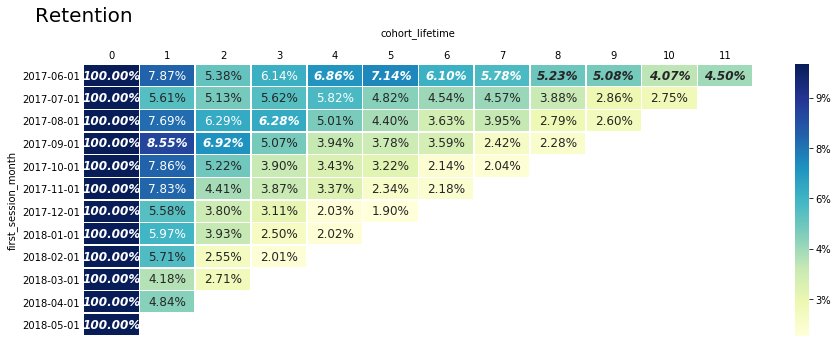

In [147]:
bokeh_visits_count_plot(visits, orders_df=orders, costs_df=costs,
                        common_datetime_column='session_start',
                        day_column='session_umd', 
                        week_column='session_week',
                        month_column='session_month',
                        orders_column='date_of_purchase',
                        count_column='uid',
                        revenue_column='revenue',
                        costs_groupby_column='date',
                        costs_column='costs',
                        session_duration_column='session_duration',
                        show_ret_heatmap=True, 
                        tabs_to_show=[1,2,3,4], active_tab=0,
                        plot_width=840, 
                        plot_height=500)

<a name="2.3."></a><br/>
<b>2.3. Conclusion:</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

* <font size="4"><b>Statistics:</b></font>.<br/>
<b>DAU: 908</b> visitors<br/>
<b>WAU: 5722</b> visitors<br/>
<b>MAU: 23228</b> visitors<br/>


* <font size="4"><b>Sessions per day</b></font>.<br/>
<b>Daily visits avg</b>: 987<br/>
It means that almost each user visits us not more than once per day.<br/><br/>

* <font size="4"><b>Session duration</b></font>.<br/>
<b>Duration of the most number of sessions</b> varies from 0 to 2 mins. In fact, users comes in and leave almost immediately.<br/><br/>

* <font size="4"><b>How often do people come back?</b></font>.<br/>
Obviously <b>Retention</b> is quite low. <b>Retention</b> of 2nd month of using website is in the range <b>from 6 to 8,5%</b> depending on the cohort. Further it keeps going low direct to <b>2,5-3%</b>.<br/>

It describes every cohort beside the <b>1st</b> one, who start using our website in June 2017. Its <b>Retention</b> is still low, but it's always in the lead comparing to other cohorts.<br/>

Why 1st cohort is so special? - We need answer this question.<br/>

Beside this on the charts there are unusual bursts and failures of activity (it's especially noticeable on <b>DAU</b> graph). We analyze them further.

* <font size="4"><b>Info on revenue, costs, number of orders and avg check</b></font>.<br/>

Using our function again and plotting our graph one more time (without heatmap and unnecessary tabs):

In [148]:
bokeh_visits_count_plot(visits, orders_df=orders, costs_df=costs,
                        common_datetime_column='session_start',
                        day_column='session_umd', 
                        week_column='session_week',
                        month_column='session_month',
                        orders_column='date_of_purchase',
                        count_column='uid',
                        revenue_column='revenue',
                        costs_groupby_column='date',
                        costs_column='costs',
                        session_duration_column='session_duration',
                        show_ret_heatmap=False, 
                        tabs_to_show=[7,5,6,1], active_tab=0,
                        plot_width=850, 
                        plot_height=500)

Here we have a data on <b>profit, revenue and costs (total and by advertising Channel); number of orders and average check; DAU</b>.

<font size="4"><b>Profit</b> (tab <b>"Profit"</b>).</font><br/>
Mostly graph lies below "0", it means that the company incurs losses. The average "profit" per day is <b> -212 thousand rubles</b>. In fact, it is losses. This indicator is going to be determining factor whether advertising company had success or not.<br/><br/>
  
<font size="4"><b>Revenue and costs</b> (tab <b>"Revenue and costs"</b>).</font><br/>
"Extended" version of the profit chart. Here in details we can look at the values of both revenue and advertising costs  in order to understand how the profit of each day was formed. At the same time, on the graph we can show (separately or together) the indicators of revenue, costs, average order cost (to understand what had a greater impact on the final revenue - the number of orders or the average check) and costs by advertising Channel (to find out in which Channel we've invested more this day).<br/><br/>
  
<font size="4"><b>Number of orders, average check</b> (tab <b>"Orders count, avg check"</b>).</font><br/>
We will observe how the indicator of the number of completed orders for each day has changed. We can also show the average check.<br/><br/>
  
<font size="4"><b>Number of unique users per day (and total visits)</b> (tab <b>"DAU + daily visits"</b>).</font><br/>

Let's see how traffic grows/falls and how this correlates with changes in advertising costs.<br/><br/>
  
Now we're going to determine anomalies for each graph and analyse a behaviour of all indicators:

<table border="1" cellspacing="0" cellpadding="0">
<td><b>Date</b></td>
<td><b>Revenue, K rbl.</b></td>
<td><b>Costs,<br/> K rbl.</b></td>
<td><b>Profit, K rbl.</b></td>
<td><b>Avg check, K rbl.</b></td>
<td><b>Number of orders</b></td>
<td><b>Number of unique ids, prs.</b></td>
<td><font size="3"><b>Conclusion</b></font></td>   
<tr>
<td> <b>8 June 2017</b></td>
<td>444<span style="color:green">&#x2796;</span></td>
<td>1354<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-910</b></font></td>
<td>2<span>&#x2796;</span></td>
<td>181<span style="color:green">&#x25B2;</span></td>
<td>868<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Advertising campaign helped us to increase the number of orders but it was not enough to seriously increase profits because average check was pretty low.</font></td>
<tr>
<td> <b>14 July 2017</b></td>
<td>737<span style="color:green">&#x2796;</span></td>
<td>1328<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-591</b></font></td>
<td>5<span>&#x2796;</span></td>
<td>138<span>&#x2796;</span></td>
<td>839<span style="color:green">&#x25B2;</span></td>
<td><font size="3">The effect of advertising had not met the expectations. The number of visitors has increased but they did not start to buy more.</font></td>
<tr>
<td> <b>17 July 2017</b></td>
<td>1759<span style="color:green">&#x25B2;</span></td>
<td>1155<span style="color:red">&#x25B2;</span></td>
<td><font color=green><b>604</b></font></td>
<td>8<span>&#x25B2;</span> </td>
<td>225<span>&#x25B2;</span> </td>
<td>1138<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Advertising campaign was successfil. Revenue increased due to increased number of clients and, therefore, number of orders and average value of check.</font></td>
<tr>
<td> <b>6 October 2017</b></td>
<td>1350<span style="color:green">&#x2796;</span></td>
<td>1758<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-408</b></font></td>
<td>4<span>&#x25BC;</span> </td>
<td>371<span>&#x25B2;</span> </td>
<td>1418<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Advertisement increased the number of orders, but average check was quite low to provide sufficient revenue, that's why we have a loss. Probably there were some not big activities that's why prices were low.</font></td>
<tr>
<td> <b>27 October 2017</b></td>
<td>893<span style="color:red">&#x25BC;</span></td>
<td>1739<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-846</b></font></td>
<td>5<span>&#x2796;</span></td>
<td>188<span>&#x2796;</span></td>
<td>1187<span style="color:green">&#x2796;</span></td>
<td><font size="3">Ad campaign didn't change any indicators. It should be reviewed.</font></td>
<tr>
<td> <b>16 November 2017</b></td>
<td>1916<span style="color:green">&#x25B2;</span></td>
<td>1811<span style="color:red">&#x25B2;</span></td>
<td><font color=green><b>105</b></font></td>
<td>8<span>&#x25B2;</span>  </td>
<td>254<span>&#x25B2;</span>  </td>
<td>1604<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Quite small, but still successful advertising campaign.</font></td>
<tr>
<td> <b>24 November 2017</b></td>
<td>3398<span style="color:green">&#x25B2;</span><span style="color:green">&#x25B2;</span></td>
<td>3459<span style="color:red">&#x25B2;</span><span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-61</b></font></td>
<td>4<span>&#x2796;</span></td>
<td>814<span>&#x25B2;</span><span>&#x25B2;</span></td>
<td>3319<span style="color:green">&#x25B2;</span><span style="color:green">&#x25B2;</span></td>
<td><font size="3">Advertising campaign with the biggest for the entire annual period. It increased the number of orders several times, but still it made zero profit in terms of finance.</font></td>
<tr>
<td> <b>10 December 2017</b></td>
<td>4661<span style="color:green">&#x25B2;</span></td>
<td>1071<span style="color:green">&#x2796;</span></td>
<td><font color=green><b>3590</b></font></td>
<td>29<span>&#x25B2;</span><span>&#x25B2;</span></td>
<td>160<span>&#x2796;</span></td>
<td>1130<span style="color:red">&#x25BC;</span></td>
<td><font size="3">The most successful day for the company this year in terms of effectiveness of advertisement and profit. Average costs (compared to nearby periods) haven't changed, in other words, no "aggressive investments" were made in advertising, but revenue grew considerably. And the amount of the average check increased almost sixfold (comparing to to the average value of 5 thousand rubles). Perhaps some big of world band group arrived and people were buying tickets not one at a time, that's why we have such a high average amount per check.</font></td>
<tr>
<td> <b>11 December 2017</b></td>
<td>1018<span style="color:red">&#x25BC;</span></td>
<td>2121<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-1103</b></font></td>
<td>5<span>&#x2796;</span></td>
<td>209<span>&#x2796;</span></td>
<td>1505<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Investments were made in advertising (Source 3) immediately after a successful day, apparently we thought that it's going to pay off more, and this costed the company financial losses, because this campaign had no effect on sales.</font></td>
<tr>
<td> <b>10 February 2018</b></td>
<td>1071<span style="color:red">&#x25BC;</span></td>
<td>1981<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-910</b></font></td>
<td>4<span>&#x2796;</span></td>
<td>244<span>&#x2796;</span></td>
<td>1189<span style="color:green">&#x2796;</span></td>
<td><font size="3">Advertisement with "regular" investment campaign. Without the desired effect. Made a loss.</font></td>
<tr>
<td> <b>30-31 March 2018</b></td>
<td>50<span style="color:red">&#x25BC;</span><span style="color:red">&#x25BC;</span></td>
<td>15<span style="color:green">&#x25BC;</span><span style="color:green">&#x25BC;</span></td>
<td>35</td>
<td>2<span>&#x25BC;</span> </td>
<td>8<span>&#x25BC;</span><span>&#x25BC;</span> </td>
<td>60<span style="color:red">&#x25BC;</span><span style="color:red">&#x25BC;</span></td>
<td><font size="3">All indicators dropped down drastically. Perhaps within 1 (or a little more) day the website was unavailable to users or all the tags with which we tracks our crucial values stopped working. It is necessary contact our technival service to find out the reasons this weird behaviour.</font></td>
<tr>
<td> <b>31 May 2018</b></td>
<td>4614<span style="color:green">&#x25B2;</span></td>
<td>2154<span style="color:red">&#x25B2;</span></td>
<td><font color=green><b>2460</b></font></td>
<td>8<span>&#x25B2;</span></td>
<td>610<span>&#x25B2;</span><span>&#x25B2;</span></td>
<td>1997<span style="color:green">&#x25B2;</span></td>
<td><font size="3">The second most successful advertising company. Big investments (in all advertising Channels), but it paid off with a margin. The average check and the number of orders grown significantly on this day, which allowed us to make good revenue.</font></td>
</table>

Researches were made pointwise. They may not describe the whole picture, because the effect of advertising usually does not last for 1 day, and the goal of an advertising campaign is not always to make revenue on that day. Sometimes it's done to attract users, especially if the web-resource is "young" enough.<br/><br/>


<b> Nevertheless, according to the results of advertising campaigns, it is necessary to negotiate with marketers, since it's obvious that not every investment in a particular advertising channel was successful. About the period of March 30-31, it is necessary to check with the technical service, what was the reason for such sharp declines for all indicators. </b> <br/> <br/>

Further, we'll return to the question of marketing <font size = "2"> ([go to marketing] (# 4.)) </font> and analyze how revenue and expenses relate to each other and which advertising Channel seems to be the most effective one and which problems each ad Channel has.

<a name="2.4."></a><br/>
<b>2.4. Retention Heatmap (relative and absolute values)</b>:<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Let's check our <b>Retention heatmap</b> once more, but this time with its both relative and absolute values:

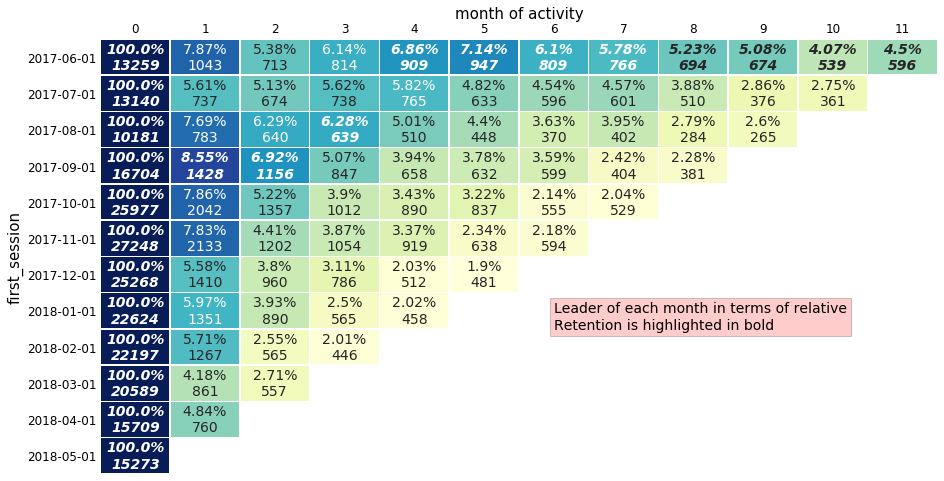

In [24]:
# getting pivotes of relative and absolute Retention

df_ret_prepare = visits.copy()
first_session_date = df_ret_prepare.groupby('uid')['session_start'].min()
first_session_date.name = 'first_session_month'
df_ret_prepare = df_ret_prepare.join(first_session_date,on='uid')
df_ret_prepare['first_session_month'] = df_ret_prepare['first_session_month'].astype('datetime64[M]')
df_ret_prepare['session_month'] = df_ret_prepare['session_start'].astype('datetime64[M]')
df_ret_prepare['cohort_lifetime'] = df_ret_prepare['session_month'] - df_ret_prepare['first_session_month']
df_ret_prepare['cohort_lifetime'] = df_ret_prepare['cohort_lifetime'] / np.timedelta64(1,'M')
df_ret_prepare['cohort_lifetime'] = df_ret_prepare['cohort_lifetime'].round().astype('int')

cohorts_ret = (df_ret_prepare
                       .groupby(['first_session_month', 'cohort_lifetime'])
                       .agg({'uid': 'nunique'})
                       .reset_index()
          )

init_users_count = cohorts_ret[cohorts_ret['cohort_lifetime']==0][['first_session_month', 'uid']]
init_users_count = init_users_count.rename(columns={'uid': 'cohort_users'})

cohorts_ret = cohorts_ret.merge(init_users_count, on='first_session_month')
cohorts_ret['retention'] = cohorts_ret['uid']/cohorts_ret['cohort_users']

retention_pivot_abs = cohorts_ret.pivot_table(index='first_session_month', columns='cohort_lifetime',
                                      values='uid', aggfunc='sum')
retention_pivot_rel = cohorts_ret.pivot_table(index='first_session_month', columns='cohort_lifetime',
                                      values='retention', aggfunc='sum')
retention_pivot_rel = (retention_pivot_rel * 100).round(2)

# creating df, where each cell has both values
df_retention_rel_abs = pd.DataFrame(index=retention_pivot_rel.index, columns=retention_pivot_rel.columns) 

for col in retention_pivot_rel.columns:
    first_part = retention_pivot_rel[col].astype('str') + '%' + '\n'
    second_part = retention_pivot_abs[col].astype('str').str.rstrip('0').str.rstrip('.')
    df_retention_rel_abs[col] = first_part + second_part
df_retention_rel_abs = df_retention_rel_abs.replace('nan%\nnan', '')

# creating heatmap
max_in_each_column_ret = np.max(retention_pivot_rel, axis=0)

plt.figure(figsize=(15,8))

heatmap_retention_rel_abs = sns.heatmap(retention_pivot_rel, fmt='', annot=df_retention_rel_abs.values, 
                                        cmap='YlGnBu', linewidths=.5,
                                        mask=retention_pivot_rel == max_in_each_column_ret, cbar=False, vmax=10,
                                        annot_kws={"size": 14})


heatmap_retention_rel_abs = sns.heatmap(retention_pivot_rel, fmt='', annot=df_retention_rel_abs.values, 
                                        cmap='YlGnBu', linewidths=.5,
                                        mask=retention_pivot_rel != max_in_each_column_ret,
                                        annot_kws={"style": "italic", "weight": "bold", "size": 14}, vmax=10,
                                        cbar=False)

y_labels_ret = heatmap_retention_rel_abs.set_yticklabels(retention_pivot_rel.index.date)
heatmap_retention_rel_abs.set_xlabel('month of activity', fontsize=15)
heatmap_retention_rel_abs.set_ylabel('first_session', fontsize=15)
heatmap_retention_rel_abs.tick_params(length=0)
heatmap_retention_rel_abs.set_xticklabels(heatmap_retention_rel_abs.get_xmajorticklabels(), fontsize = 12)
heatmap_retention_rel_abs.set_yticklabels(heatmap_retention_rel_abs.get_ymajorticklabels(), fontsize = 12)
heatmap_retention_rel_abs.xaxis.tick_top()
heatmap_retention_rel_abs.xaxis.set_label_position('top')
text_ret = plt.text(6.5, 8, 'Leader of each month in terms of relative\nRetention is highlighted in bold',
                bbox=dict(facecolor='red', alpha=0.2),
                fontsize=14)

Here we can see that since October the average number of cohorts has seriously increased - from ~ 13,000 people to 20,000+ people. It is important to analyze and clarify what played a major role in such a sharp increase in site traffic. <b>Retention</b> of these "more populated" cohorts is slightly lower than <b>Retention</b> of the first three cohorts, however, in absolute terms we have almost 2 times more users who continue using our resource comparing to the first cohorts (except the first one which is abnormally active and "constant" compared to the rest).

<hr style="border: 1px solid #000;">

<a name="3."></a><br/>
<font size="5"><b>3. Sales Data Analysis</b></font>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>
* 3.1. When people start buying.
* 3.2. Number of orders within one period.
* 3.3. Average check.
* 3.4. LTV.

<br/>
We'll work with <b>orders</b> and <b>visits</b> dataframes.

<a name="3.1."></a><br/>
<b>3.1. When people start buying</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Let's prepare our data.

Grouping <b>orders</b> dataFrame by users that we could find out a date of their first order and grouping <b>visits</b> dataframe (by users again) to see a date of their first session:

In [25]:
first_purchase_date = orders.groupby('uid')[['date_of_purchase']].min().reset_index()
first_purchase_date.columns = ['uid', 'first_purchase_date']
first_session_date = visits.groupby('uid')[['session_start']].min().reset_index()
first_session_date.columns = ['uid', 'first_session']

Merging these 2 dataframes:

In [26]:
when_they_buy = first_purchase_date.merge(first_session_date, on='uid')

In [27]:
when_they_buy.head()

,uid,first_purchase_date,first_session
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00
3,2464366381792757,2018-01-28 15:54:00,2018-01-27 20:10:00
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00


Adding a column with difference in minutes between date and time of first order and date and time of first session:

In [28]:
when_they_buy['buy_diff'] = when_they_buy['first_purchase_date'] - when_they_buy['first_session']
when_they_buy['buy_diff'] = when_they_buy['buy_diff']/np.timedelta64(1, 'm')
when_they_buy['buy_diff'] = when_they_buy['buy_diff'].round(1)
when_they_buy.head(10)

,uid,first_purchase_date,first_session,buy_diff
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00,154022.0
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00,0.0
2,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00,79.0
3,2464366381792757,2018-01-28 15:54:00,2018-01-27 20:10:00,1184.0
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00,0.0
5,3077748354309989,2018-03-03 12:33:00,2018-03-03 12:08:00,25.0
6,3605148382144603,2017-09-21 20:56:00,2017-08-15 21:54:00,53222.0
7,3753586865891862,2018-03-03 13:50:00,2018-03-03 13:47:00,3.0
8,4808417689019433,2018-01-09 23:32:00,2018-01-09 23:10:00,22.0
9,4992223027560440,2018-04-04 13:54:00,2018-04-04 13:54:00,0.0


Grouping dataFrame by user and taking minimal time difference between first session and first order:

In [29]:
to_hist = when_they_buy.groupby('uid')[['buy_diff']].min()

Taking a look at the outliers and creating a histogram:

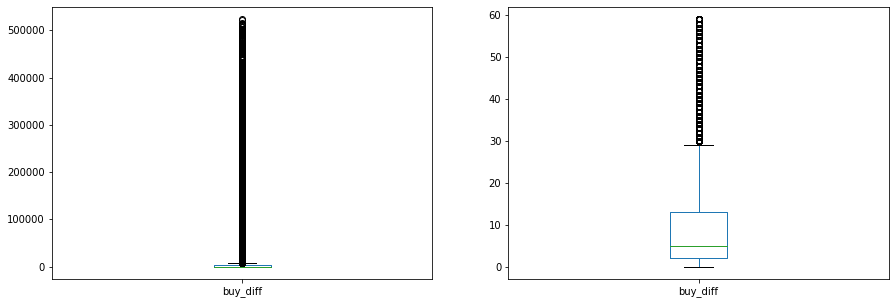

In [30]:
fig, axes = plt.subplots(1,2, figsize=(15,5))

to_hist.plot(kind='box', ax=axes[0])
to_hist.query('buy_diff < 60').plot(kind='box', ax=axes[1])

All outliers are located above the "30 minutes" mark.<br/><br/>

Based on these data we'll plot a histogram of the distribution of this time difference:

In [31]:
import pandas_bokeh
pandas_bokeh.output_notebook()

Loading BokehJS ...

In [32]:
title = "Histogram of distribution of the difference between the time of first order and beginning of the first session"

first_order_hist = to_hist.query('buy_diff <= 30').plot_bokeh.hist(
                                bins=30,
                                xlim=(0, 30),
                                ylim=(0,3000),
                                title=title,
                                xlabel="Time difference (between 1st session and 1st order)",
                                ylabel="Frequency",
                                legend=False,
                                color="#83C2BA",
                                sizing_mode="scale_width",
                                line_color="black")

<b>Conclusion</b>: for most users 3 minutes are enough to complete an order. They come and almost immediately make an order. It's obvious that they come only to complete an order, not to find something interesting and only then buy a ticket.<br/><br/>

Now we should explore information about how often clients buy and average order check.

<a name="3.2."></a><br/>
<b>3.2. Orders per period</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Let's determine "period" as one month. Checking the number of orders of each buyer per his "individual" month.

In [33]:
orders.head()

,date_of_purchase,revenue,uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


Grouping by users and finding date and time of first order for each client:

In [34]:
df_purchases_by_month = orders.copy()
first_purchase = df_purchases_by_month.groupby('uid')['date_of_purchase'].min().reset_index()
first_purchase.columns = ['uid', 'date_of_first_purchase']
order_frequency = pd.merge(df_purchases_by_month, first_purchase, on='uid')
order_frequency.head(10)

,date_of_purchase,revenue,uid,date_of_first_purchase
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00
5,2017-06-01 08:43:00,0.18,10402394430196413321,2017-06-01 08:43:00
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01 08:54:00
7,2017-06-05 14:30:00,7.33,12464626743129688638,2017-06-01 08:54:00
8,2017-06-01 09:22:00,1.22,3644482766749211722,2017-06-01 09:22:00
9,2017-06-02 12:44:00,0.85,3644482766749211722,2017-06-01 09:22:00


Adding new column <b>time_difference</b>, which will show to us the time how many months client "lives" from the date of his first purchase to the date of current order:

In [35]:
def diff_month(row):
    date1 = row['date_of_purchase']
    date2 = row['date_of_first_purchase']
    return (date1.year - date2.year) * 12 + date1.month - date2.month

order_frequency['time_difference'] = order_frequency.apply(diff_month, axis=1)
order_frequency['date_of_first_purchase'] = order_frequency['date_of_first_purchase'].astype('datetime64[M]')
order_frequency.head(10)

,date_of_purchase,revenue,uid,date_of_first_purchase,time_difference
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,0
5,2017-06-01 08:43:00,0.18,10402394430196413321,2017-06-01,0
6,2017-06-01 08:54:00,1.83,12464626743129688638,2017-06-01,0
7,2017-06-05 14:30:00,7.33,12464626743129688638,2017-06-01,0
8,2017-06-01 09:22:00,1.22,3644482766749211722,2017-06-01,0
9,2017-06-02 12:44:00,0.85,3644482766749211722,2017-06-01,0


Selecting cohorts by the first session and by months and calculating the number of orders for each month, the number of unique users and the number of orders per one user:

In [36]:
purchases_grouped_by_cohorts = (order_frequency
                                                .groupby(['date_of_first_purchase','time_difference'])
                                                .agg({'date_of_purchase': 'count', 'uid': 'nunique'})
                               )

purchases_per_player = purchases_grouped_by_cohorts['date_of_purchase']/purchases_grouped_by_cohorts['uid']
purchases_grouped_by_cohorts['purchases_per_player'] = purchases_per_player
purchases_grouped_by_cohorts = purchases_grouped_by_cohorts.reset_index()
purchases_grouped_by_cohorts.head()

,date_of_first_purchase,time_difference,date_of_purchase,uid,purchases_per_player
0,2017-06-01,0,2354,2023,1.163618
1,2017-06-01,1,177,61,2.901639
2,2017-06-01,2,174,50,3.480000
3,2017-06-01,3,226,54,4.185185
4,2017-06-01,4,292,88,3.318182


Grouping data:

In [37]:
purchase_pivot = purchases_grouped_by_cohorts.pivot_table(index='date_of_first_purchase', 
                                                          columns='time_difference', 
                                                          values='purchases_per_player')

In [38]:
purchase_pivot

time_difference,0,1,2,3,4,5,6,7,8,9,10,11
date_of_first_purchase,,,,,,,,,,,,
2017-06-01,1.163618,2.901639,3.480000,4.185185,3.318182,3.253731,4.451613,3.702128,3.655172,3.400000,2.133333,1.622642
2017-07-01,1.136765,1.923077,2.105263,1.625000,1.469388,2.157895,1.694444,1.282051,1.380952,1.090909,2.038462,NaN
2017-08-01,1.118978,1.862069,1.886792,1.840909,2.125000,1.937500,1.633333,1.772727,2.421053,1.483871,NaN,NaN
2017-09-01,1.136381,1.684615,1.610000,2.216216,1.288462,1.703125,1.636364,1.513514,1.418605,NaN,NaN,NaN
2017-10-01,1.143779,1.524272,1.317073,1.326087,1.387097,1.430556,1.535714,1.865672,NaN,NaN,NaN,NaN
2017-11-01,1.179368,1.788288,1.516667,1.990566,1.679012,1.229167,1.645161,NaN,NaN,NaN,NaN,NaN
2017-12-01,1.152635,1.849315,1.961165,1.845361,1.720000,1.666667,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01,1.121554,1.964912,1.915663,1.488372,1.733333,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,1.121611,1.881356,1.431034,1.794872,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Creating <b>heatmap</b> for this pivot. We will have to plot it again further, that's why we should create a function:

In [39]:
def plot_heatmap(pivot_table, vmax=3, title='Heatmap', figsize=(15,6), annot_font_size=13, 
                 round_val=None, fmt='.2f',
                 xlabel_text='Время использования ресурса (мес.)',
                 ylabel_text='Начало использования ресурса'):
    pivot_table_copy = pivot_table.copy()
    if round_val is not None:
        fmt='.{}f'.format(round_val)
            
    pivot_table_copy.loc[''] = np.nan
    pivot_table_copy.loc['Average'] = pivot_table_copy[:-1].mean(axis=0)
    pivot_table_copy.loc['Average'][0] += 0.1
    
    from matplotlib.colors import ListedColormap

    max_mean = pivot_table_copy.loc['Average'].max()
    max_in_each_column = np.max(pivot_table_copy[:-2], axis=0)
    max_in_each_column.iloc[-1] += 5
    plt.figure(figsize=figsize)

    y_labels_list = list()
    for i in pivot_table_copy.index[:-2]:
        y_labels_list.append(str(i.date().year) + '-' + ['', '0'][i.date().month < 10] + 
                             str(i.date().month) + '-' + '0' +
                             str(i.date().day))
    
    y_labels_list.append('')
    y_labels_list.append('Average')

    # общая
    heatmap = sns.heatmap(pivot_table_copy, fmt=fmt, annot=True, cmap=ListedColormap(['white']), 
                          vmax=vmax, linewidths=.5, cbar=False,
                          mask=((pivot_table_copy == max_mean) | (pivot_table_copy == max_in_each_column)),
                          annot_kws={"size": annot_font_size})


    # нежирные
    heatmap = sns.heatmap(pivot_table_copy[:-2], fmt=fmt, annot=True, cmap='YlGnBu', vmax=vmax, linewidths=.5,
                      mask=pivot_table_copy[:-2] == max_in_each_column, 
                      annot_kws={"size": annot_font_size})


    heatmap.xaxis.labelpad = 15
    heatmap.tick_params(length=0)

    # жирные
    heatmap = sns.heatmap(pivot_table_copy[:-2], fmt=fmt, annot=True, cmap='YlGnBu', vmax=vmax, linewidths=.5,
                          mask=pivot_table_copy[:-2] != max_in_each_column,
                          annot_kws={"weight": "bold", "size": annot_font_size},
                          cbar=False)

    # жирным общее максимальное
    heatmap = sns.heatmap(pivot_table_copy, fmt=fmt, annot=True, cmap=ListedColormap(['white']), 
                          vmax=vmax, linewidths=.5, cbar=False,
                          mask=pivot_table_copy != max_mean,
                          annot_kws={"weight": "bold", "size": annot_font_size})
    heatmap.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)

    heatmap.xaxis.set_label_position('top')
    heatmap.xaxis.labelpad = 15
    heatmap.yaxis.set_label_coords(-0.13, 0.57)
    y_labels = heatmap.set_yticklabels(y_labels_list)
    heatmap.tick_params(length=0)
    title = plt.title(title, x=0.0, fontsize=20)
    heatmap.set_xlabel(xlabel_text, fontsize=12)
    heatmap.set_ylabel(ylabel_text, fontsize=12)
    mean_value = pivot_table_copy.loc['Average'].mean()

Plotting <b>Heatmap</b> which describes avg number of orders per cohorts and months:

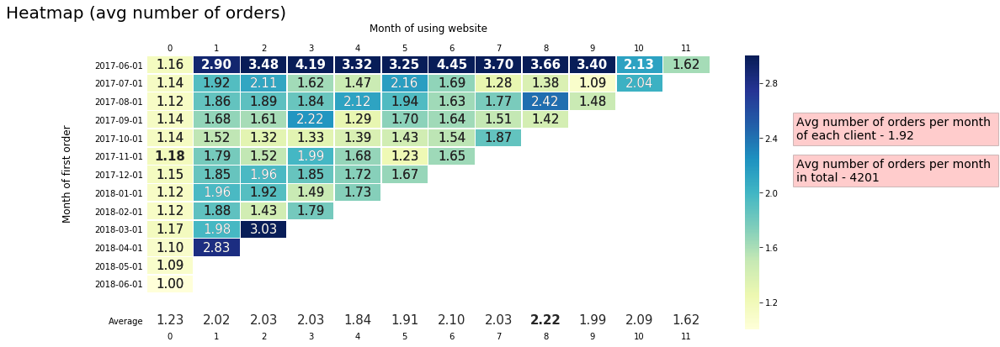

In [40]:
plot_heatmap(purchase_pivot, vmax=3, title='Heatmap (avg number of orders)',
             annot_font_size=15,
             xlabel_text='Month of using website',
             ylabel_text='Month of first order')
mean_value = purchase_pivot.mean().mean()
purchase_count_mean_revenue = order_frequency['revenue'].count() / 12
order_mean_revenue = order_frequency['revenue'].mean()
text = plt.text(0.84, 0.65, 'Avg number of orders per month \nof each client - {:.2f}'.
                format(mean_value),
                bbox=dict(facecolor='red', alpha=0.2),
                fontsize=14, transform=plt.gcf().transFigure)
text = plt.text(0.84, 0.535, 'Avg number of orders per month \nin total - {:.0f}'.
                format(purchase_count_mean_revenue),
                bbox=dict(facecolor='red', alpha=0.2),
                fontsize=14, transform=plt.gcf().transFigure)

And again the first cohort, which is already has the highest <b>Retention</b>, is the leader - clients from this cohort makes on average more than 3 orders per month.

In the first month all users only visit website without making orders and only in the second month they really start buying and on average make about 2 orders per month.

The March and April cohorts are a bit special - in the second and first month of using the resource respectively they did (almost) 3 purchases per client, (other cohorts on average has less then 2 purchases per client). It looks pretty good and we should explore it.

<a name="3.3."></a><br/>
<b>3.3. Average order check</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Calculating average check for each cohort per month:

In [41]:
orders_check = orders.copy()

orders_check['date_of_purchase'] = orders_check['date_of_purchase'].astype('datetime64[M]')

first_orders_month = orders_check.groupby('uid').agg({'date_of_purchase': 'min'}).reset_index()
first_orders_month.columns = ['uid', 'first_purchase_date']

cohort_sizes = first_orders_month.groupby('first_purchase_date').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.columns = ['first_purchase_date', 'n_buyers']

orders_first_orders_month = orders_check.merge(first_orders_month, on='uid')
cohorts = (orders_first_orders_month
                                    .groupby(['date_of_purchase', 'first_purchase_date'])
                                    .agg({'revenue': 'median'})
                                    .reset_index()
          )
mean_check = cohorts.merge(cohort_sizes, on='first_purchase_date')
time_diff = mean_check['date_of_purchase'] - mean_check['first_purchase_date']
mean_check['age'] = time_diff / np.timedelta64(1, 'M')
mean_check['age'] = mean_check['age'].round().astype('int')
mean_check_pivot = mean_check.pivot_table(index="first_purchase_date", columns="age", values="revenue")

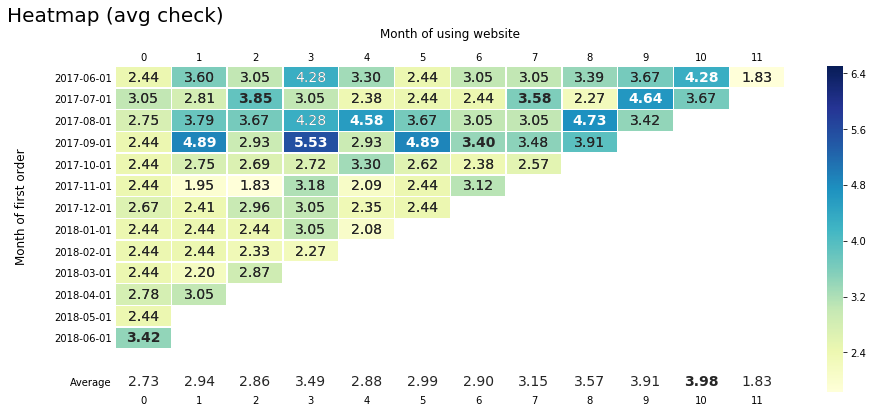

In [42]:
plot_heatmap(mean_check_pivot, vmax=6.5, title='Heatmap (avg check)',
             annot_font_size=14,
             xlabel_text='Month of using website',
             ylabel_text='Month of first order')

Average (median) check is 3 thousand rubles. But there is some particularity - average check of first 4 cohorts is a bit higher than the check of the rests. And it's the users who have a higher <b>Retention</b> - they not only stay longer, they also make more expensive orders.<br/><br/>

It's necessary to study activity of clients from these cohorts and how they use the service in more detail. This can give us a hint how to work in this direction with less active cohorts who are not ready to spend money like that.

<a name="3.4."></a><br/>
<b>3.4. LTV</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Calculating <b>LTV</b>.<br/><br/>

Let's look at <b>LTV</b> with a margin coefficient of 0.5 and 1 (although, in my opinion, the option with a margin coefficient of 1 can't be realistic, considering that <b>J.K.</b> only <b>distributes</b> tickets, but due to the fact that this indicator is not predefined, we will examine these two options):

A function to obtain <b>LTV</b> pivot table for given <b>margin_rate</b> value:

In [43]:
# a function to get LTV pivot table depending on given margin_rate

def get_LTV_pivot(margin_rate=0.5):
    prepare_ltv = orders.copy()

    prepare_ltv['date_of_purchase'] = prepare_ltv['date_of_purchase'].astype('datetime64[M]')

    first_orders_month = prepare_ltv.groupby('uid').agg({'date_of_purchase': 'min'}).reset_index()
    first_orders_month.columns = ['uid', 'first_purchase_date']

    cohort_sizes = first_orders_month.groupby('first_purchase_date').agg({'uid': 'nunique'}).reset_index()
    cohort_sizes.columns = ['first_purchase_date', 'n_buyers']

    margin_rate = margin_rate

    orders_first_orders_month = prepare_ltv.merge(first_orders_month, on='uid')
    cohorts = (orders_first_orders_month
                                        .groupby(['date_of_purchase', 'first_purchase_date'])
                                        .agg({'revenue': 'sum'})
                                        .reset_index()
              )
    LTV = cohorts.merge(cohort_sizes, on='first_purchase_date')
    
    LTV['gp'] = LTV['revenue'] * margin_rate
    LTV['age'] = (LTV['date_of_purchase'] - LTV['first_purchase_date']) / np.timedelta64(1, 'M')
    LTV['age'] = LTV['age'].round().astype('int')
    LTV['ltv'] = LTV['gp'] / LTV['n_buyers']
    
    LTV_pivot = LTV.pivot_table(index="first_purchase_date",
                columns="age",
                values="ltv",
                aggfunc='mean')
    
    return LTV, LTV_pivot

In [44]:
# a function to plot LTV heatmap

def LTV_heatmap(LTV_pivot, margin_rate=0.5):
    LTV_pivot_copy = LTV_pivot.copy()

    LTV_pivot_copy.loc[:, ''] = np.nan
    LTV_pivot_copy.loc[:, 'Cumsum'] = LTV_pivot_copy.sum(axis=1)

    from matplotlib.colors import ListedColormap

    max_cumsum = LTV_pivot_copy.loc[:, 'Cumsum'].max()
    max_in_each_column = np.max(LTV_pivot_copy.iloc[:, :-1], axis=0)

    plt.figure(figsize=(15,6))

    # common heatmap (white background color)
    heatmap = sns.heatmap(LTV_pivot_copy, fmt='.2f', annot=True, cmap=ListedColormap(['white']), 
                          vmax=2, linewidths=.5, cbar=False, 
                          mask=((LTV_pivot_copy == max_cumsum) | (LTV_pivot_copy == max_in_each_column)),
                          annot_kws={"size": '13'})

    # not bolded values
    heatmap = sns.heatmap(LTV_pivot_copy.iloc[:, :-1], fmt='.2f', annot=True, cmap='YlGnBu', vmax=2, 
                          linewidths=.5, mask=LTV_pivot_copy.iloc[:, :-1] == max_in_each_column, 
                          annot_kws={"size": '13'})

    # bolded values
    heatmap = sns.heatmap(LTV_pivot_copy.iloc[:, :-1], fmt='.2f', annot=True, cmap='YlGnBu', vmax=2,
                          linewidths=.5, mask=LTV_pivot_copy.iloc[:, :-1] != max_in_each_column,
                          annot_kws={"weight": "bold", "size": '13'},
                          cbar=False)

    # cumsum's max
    heatmap = sns.heatmap(LTV_pivot_copy, fmt='.2f', annot=True, cmap=ListedColormap(['white']), 
                          vmax=2, linewidths=.5, cbar=False,
                          mask=LTV_pivot_copy != max_cumsum,
                          annot_kws={"weight": "bold", "size": '13'})

    heatmap.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)

    heatmap.xaxis.set_label_position('top')
    heatmap.xaxis.labelpad = 15
    heatmap.yaxis.set_label_coords(-0.13, 0.57)
    y_labels = heatmap.set_yticklabels(LTV_pivot_copy.index.date)
    heatmap.tick_params(length=0)
    title='LTV (margin_rate={})'.format(margin_rate)
    title = plt.title(title, x=0.0, fontsize=20)

<a name="3.4.1."></a><br/>
<b>3.4.1. Heatmap LTV (margin_rate = 0.5)</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Showing <b>LTV</b> heatmap <b>(margin_rate = 0.5)</b>:

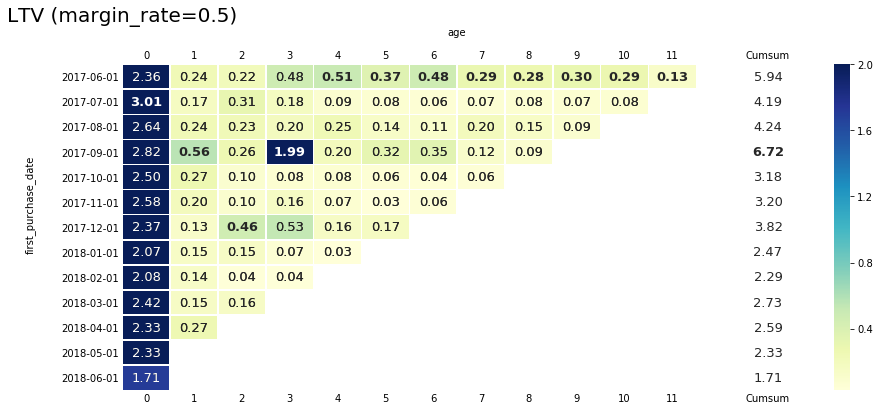

In [45]:
LTV_05, LTV_pivot_05 = get_LTV_pivot(0.5)

LTV_heatmap(LTV_pivot_05, 0.5)

The vast majority of clients, as we've already noticed on the <b>Retention</b> heatmap, make 1 order and no longer returns. The same confirms <b>LTV</b> heatmap - the average LTV-value of the zero month (after which everyone usually leaves) is 2.5 thousand rubles. And then it drops down to 0.2 thousand rubles. <br/> <br/>
The first cohort is a bit different again - it has average LTV-value 2 times higher than the rest of the cohorts - about 0.4 thousand rubles. <br/>

And the 3rd month of the 4th cohort is remarkable - 2 thousand rubles. It is necessary to explore what was the reason for this. Considering that <b>Retention</b> of this cohort in this period has no spikes, it means that this <b>LTV</b> made the "remaining" number of clients, in other words, small amount of clients (compared with the initial number of clients in the cohort who "made" 2.82 thousand rubles <b>LTV</b>).<br/> <br/>

The cumulative <b>LTV</b> result of the 4th cohort is 6.72 thousand rubles, the 1st cohort has 5.94 thousand rubles. The remaining cohorts have a value of cumsum <b>LTV</b> of 4 thousand rubles and below.

<a name="3.4.2."></a><br/>
<b>3.4.2. LTV Heatmap (margin_rate = 1)</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Showing <b>LTV</b> heatmap <b>(margin_rate = 1)</b>:

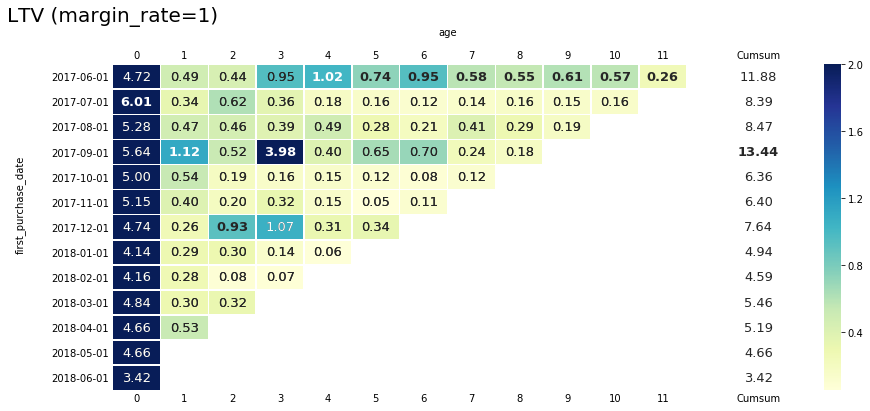

In [46]:
LTV_1, LTV_pivot_1 = get_LTV_pivot(1)
LTV_heatmap(LTV_pivot_1, 1)

The same signs of leadership of the first cohort persist (and there's no surprise since we've simply multiplied result of LTV_05 by 2).

<a name="4."></a><br/>
<font size="5"><b>4. Marketing Data Analysis</b></font>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>
* 4.1.  Money spent (total, per source, within time)<br/>
How much does it cost to attract one buyer from each source?<br/>
* 4.2. ROI

<br/>
We'll analyze costs in parallel with the revenue to get a complete picture of how one "justifies the other". <br/> <br/>
DataFrames to use: <b>costs</b> (for cost analysis) and <b>orders</b> (for revenue analysis).

<a name="4.1."></a><br/>
<b>4.1. Money spent (total, per source, within time).<br/>
How much does it cost to attract one buyer from each source?</b><br/>
<font size="2">([to the contents](#0.0))</font><br/>

Preparing data and creating new DataFrame with 2 rows and 1 column with info on total revenue and total cosrs:

In [47]:
costs_copy = costs.copy()
orders_copy = orders.copy()

costs_copy['date'] = costs_copy['date'].values.astype('datetime64[M]') 
costs_grouped = costs_copy.groupby('date').agg({'costs': 'sum'})

In [48]:
orders_copy['date_of_purchase'] = orders_copy['date_of_purchase'].astype('datetime64[M]')
orders_grouped = orders_copy.groupby('date_of_purchase').agg({'revenue': 'sum'})

In [49]:
data = {'summary': [round(orders_grouped.sum().values[0], 2),round(costs_grouped.sum().values[0], 2)]}
rev_costs = pd.DataFrame(data=data, index=['revenue', 'costs'])

<a name="4.1.1."></a><br/>
<b>4.1.1. Graph of the relationship between costs and revenues</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Plotting pie which shows relationship between total costs and total revenue:

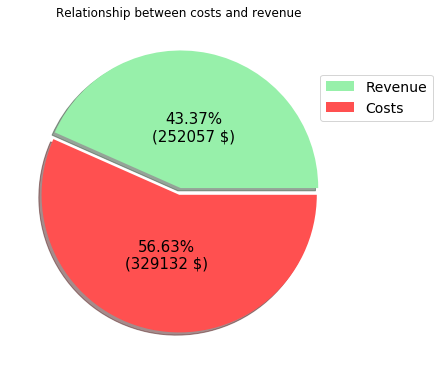

In [50]:
plt.style.use('seaborn-pastel')
summary = rev_costs.values.sum()

def func_pct(pct):
    value = float(pct/100.*summary)
    return "{:.2f}%\n({:.0f} $)".format(pct, value)

explode = (0.05, 0)  # сектор 'ultra' немного выдвинем

ax_pie = rev_costs.plot(kind='pie', y='summary', fontsize=15, use_index=False, shadow=True, explode=explode,
                        title = 'Relationship between costs and revenue', pctdistance=0.45, figsize=(15,5), 
                        autopct=lambda pct: func_pct(pct), colors=['#97F0AA', '#ff5050'], labels=None)

plt.tight_layout(pad=0)

legend = ax_pie.legend(['Revenue', 'Costs'], bbox_to_anchor=(0.89,0.87), prop={'size':14})
y_label = ax_pie.set_ylabel('')

<b>Total Revenue - 252 thousand rubles</b><br/>
<b>Total Costs - 329 thousand rubles</b><br/><br/>


Costs are higher than revenue, it means that the business makes a loss. This is a bad sign, but by now we can't say confidently that the situation is critical - it is quite possible that these investments will pay off in a slightly longer period of time.

<a name="4.1.2."></a><br/>
<b>4.1.2. Monthly revenue (showing the impact of each cohort)</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Let's check which contribution in month revenue each cohort makes:

In [51]:
orders_area = orders.copy()

orders_area['date_of_purchase'] = orders_area['date_of_purchase'].astype('datetime64[M]')

first_orders_month = orders_area.groupby('uid').agg({'date_of_purchase': 'min'}).reset_index()
first_orders_month.columns = ['uid', 'first_purchase_date']

cohort_sizes = first_orders_month.groupby('first_purchase_date').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.columns = ['first_purchase_date', 'n_buyers']

orders_first_orders_month = orders_area.merge(first_orders_month, on='uid')
cohorts = (orders_first_orders_month
                                    .groupby(['date_of_purchase', 'first_purchase_date'])
                                    .agg({'revenue': 'sum'})
                                    .reset_index()
          )
orders_area_plot = cohorts.merge(cohort_sizes, on='first_purchase_date')
time_diff = orders_area_plot['date_of_purchase'] - orders_area_plot['first_purchase_date']
orders_area_plot['age'] = time_diff / np.timedelta64(1, 'M')
orders_area_plot['age'] = orders_area_plot['age'].round().astype('int')

orders_pivot = orders_area_plot.pivot_table(index="first_purchase_date", columns="age", 
                                            values="revenue", aggfunc="sum")

orders_area_plot_hv = orders_pivot.reset_index()

orders_area_plot_hv = orders_pivot.reset_index()
xticks_1 = [i for i in range(len(orders_area_plot_hv))]
xticks_2 = orders_area_plot_hv['first_purchase_date'].astype('str').tolist()
xticks_2 = [element.split('-')[0] + '-' + element.split('-')[1] for element in xticks_2]

orders_area_plot_hv = orders_area_plot_hv.drop('first_purchase_date', axis=1)
orders_area_plot_hv = orders_area_plot_hv.T.reset_index().fillna(0)

cohorts = ['cohort' + str(i) for i in range(len(orders_area_plot_hv))]
areas = ['area' + str(i) for i in range(len(orders_area_plot_hv))]
cohorts_filled = list()
new_areas = list()

for i in range(len(cohorts)-1):
    prev_list = orders_area_plot_hv.loc[:,i].tolist()
    for count in range(i+1):
        prev_list = [0] + prev_list
        prev_list.pop(-1)
    cohorts_filled.append(prev_list)

dims = dict(kdims='Month', vdims='Revenue')

# colors
from pylab import *

cmap = cm.get_cmap('Blues', 12)    # PiYG
colors = list()

for i in range(cmap.N):
    rgb = cmap(i)[:3] 
    colors.append(matplotlib.colors.rgb2hex(rgb))
colors = colors[::-1]
#-----------------------------------


for i in range(len(cohorts_filled)):
    areas[i] = hv.Area(cohorts_filled[i], label=str(i+1), **dims).opts(color=colors[i])
    new_areas.append(areas[i])
    
opts.defaults(opts.Area(fill_alpha=0.75, height=500, width=900))
overlay = new_areas[0]
for new_area in new_areas[1:]:
    overlay = overlay * new_area

xticks = list(zip(xticks_1, xticks_2))

hv.Area.stack(overlay).relabel("Monthly revenue with impact of each cohort").opts(
                                                          legend_position='top_left', 
                                                          xticks=xticks, text_font_size='11pt',
                                                          fontsize={'title': 12, 'labels': 12, 
                                                                    'xticks': 10, 'yticks': 10})

:Overlay
   .Area.A_1  :Area   [Month]   (Revenue,Baseline)
   .Area.A_2  :Area   [Month]   (Revenue,Baseline)
   .Area.A_3  :Area   [Month]   (Revenue,Baseline)
   .Area.A_4  :Area   [Month]   (Revenue,Baseline)
   .Area.A_5  :Area   [Month]   (Revenue,Baseline)
   .Area.A_6  :Area   [Month]   (Revenue,Baseline)
   .Area.A_7  :Area   [Month]   (Revenue,Baseline)
   .Area.A_8  :Area   [Month]   (Revenue,Baseline)
   .Area.A_9  :Area   [Month]   (Revenue,Baseline)
   .Area.A_10 :Area   [Month]   (Revenue,Baseline)
   .Area.A_11 :Area   [Month]   (Revenue,Baseline)

Each cohort makes the maximum contribution to revenue in its first (zero) month of presence, the next month the contribution is significantly reduces and then gradually goes closer to zero. This is expected, considering that the <b> Retention </b> metric behaves exactly the same. <br/><br/>
However, the 4 and 5 cohorts have a slight surge at 3 and 2 months of their life respectively. Taking into consideration that there is no special surge in <b> Retenion </b> during these periods for these cohorts, we can conclude that those clients, who remained in the cohorts, made pretty many orders, or the average check increased significantly.<br/><br/>
We should note that February 2018 "knocked down" absolutely all cohorts, without exception, even the one that only "joined" the rest - the 8th: zero-month revenue fell from 35,000 thousand rubles to 20000 thousand rubles compared to the previous 7th cohort. It is necessary to analyze this month regarding advertising campaigns and their level of effectiveness.

<a name="4.1.3."></a><br/>
<b>4.1.3. Advertising Costs by time</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

In [52]:
from bokeh.models.widgets import DataTable, DateFormatter, TableColumn, RadioButtonGroup, Select
from bokeh.plotting import ColumnDataSource, figure, show
from bokeh.io import output_file, reset_output, output_notebook
from bokeh.models.widgets import Tabs, Panel, Div
from bokeh.models import Span, Range1d, CustomJS, TextInput, HoverTool, FactorRange
from bokeh.models import WheelZoomTool, NumeralTickFormatter, Legend, BoxAnnotation
from bokeh.layouts import layout, row, column, widgetbox, gridplot
from bokeh.models import SingleIntervalTicker, LinearAxis, Label, Span, CheckboxGroup
from bokeh.transform import dodge
output_notebook()

Loading BokehJS ...

In [53]:
source = ColumnDataSource(data=costs_grouped)

p = figure(x_axis_type='datetime',
           plot_width=900, plot_height=500, tools="tap, pan, wheel_zoom, reset", y_axis_label="К rubles",
           title="Advertising Costs by time")

costs_per_time_bar = p.vbar(x='date', top='costs', width=1300000000, source=source, 
color="#83C2BA", line_color="black", nonselection_fill_alpha=0.2)
p.add_tools(HoverTool(renderers=[costs_per_time_bar], tooltips=[("", "@costs{1.0}")]))
p.xaxis[0].ticker.desired_num_ticks = 15
p.xgrid.grid_line_color = None

p.ygrid.band_fill_alpha = 0.05
p.ygrid.band_fill_color = "navy"

p.xaxis.major_label_text_font_size = "11pt"
p.yaxis.major_label_text_font_size = "11pt"
p.y_range.start = 0
show(p)

A period with the most activity of injecting money into advertising is from October 2017 to March 2018 (inclusive).
In other periods the level of this activity is significantly lower.

Let’s look at the effectiveness of each advertising channel.

<a name="4.1.4."></a><br/>
<b>4.1.4. Advertising Costs per source</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Looking at the costs per each ad channel:

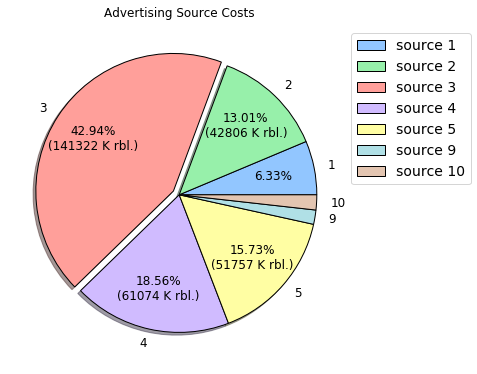

In [54]:
costs_per_source = costs.groupby('source_id').agg({'costs': 'sum'})

summary = costs_per_source.values.sum()
labels = costs_per_source.index

def func_pct(pct):
    if pct > 7:
        value = float(pct/100.*summary)
        return "{:.2f}%\n({:.0f} K rbl.)".format(pct, value)
    if pct > 6.32:
        return "{:.2f}%".format(pct)
    else:
        return ''

explode = (0, 0, 0.05, 0, 0, 0, 0)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors.append('#E3C5B1')

ax_pie = costs_per_source.plot(kind='pie', y='costs', fontsize=12, use_index=False, shadow=True, explode=explode,
                        title = 'Advertising Source Costs', pctdistance=0.7, colors=colors,
                        wedgeprops={"edgecolor":"0",'linewidth': 1, 'linestyle': 'solid', 'antialiased': True},
                        figsize=(15,5), labels=labels, autopct=lambda pct: func_pct(pct))

plt.tight_layout(pad=0)
legend_labels = list()
for label in labels:
    legend_labels.append('source ' + str(label))

legend = ax_pie.legend(legend_labels, bbox_to_anchor=(0.98,0.99), prop={'size':14})
y_label = ax_pie.set_ylabel('')

The most sponsored Channel is <b>3</b> - 40% of the investments go there.<br/>
<b>1st</b>, <b>2nd</b> and <b>4th</b> Channels have almost the same costs - around 15%.<br/>
Only 5% of the investmens go to <b>9th</b> and <b>10th Channels</b>.<br/><br/>

Now we should check the number of new users who gets attracted by each advertising source in order to measure its effectiveness.

<a name="4.1.5."></a><br/>
<b>4.1.5. Number of attracted users by advertising sources</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

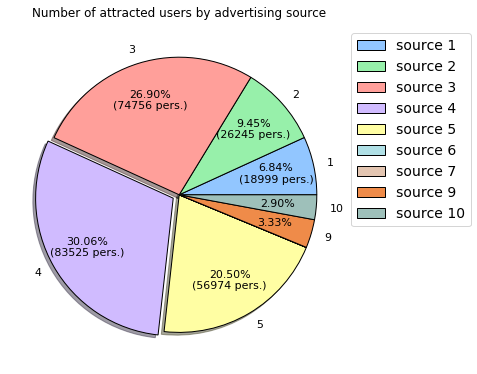

In [55]:
visits_sorted = visits.sort_values(by='session_start')

uid_per_source = visits_sorted.groupby('source id').agg({'uid': 'nunique'})

summary = uid_per_source.values.sum()
labels_for_legend = uid_per_source.index
labels_for_pie = [label if uid_per_source.loc[label].values[0] > 100 else '' for label in uid_per_source.index]

def func_pct(pct):
    if pct > 5:
        value = float(pct/100.*summary)
        return "{:.2f}%\n({:.0f} pers.)".format(pct, value)
    elif pct > 1:
        return "{:.2f}%".format(pct)

explode = (0, 0, 0, 0.05, 0, 0, 0, 0, 0)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors.append('#E3C5B1')
colors.append('#EF8B49')
colors.append('#9EC0BA')

ax_pie = uid_per_source.plot(kind='pie', y='uid', fontsize=11, use_index=False, shadow=True, explode=explode,
                        title = 'Number of attracted users by advertising source', 
                        pctdistance=0.72, colors=colors,
                        wedgeprops={"edgecolor":"0",'linewidth': 1, 'linestyle': 'solid', 'antialiased': True},
                        figsize=(15,5), labels=labels_for_pie, autopct=lambda pct: func_pct(pct))

plt.tight_layout(pad=0)
legend_labels = list()
for label in labels_for_legend:
    legend_labels.append('source ' + str(label))

legend = ax_pie.legend(legend_labels, bbox_to_anchor=(0.98,0.99), prop={'size':14})
y_label = ax_pie.set_ylabel('')

<b>Channel 3</b> on which we spend the most amount of money is spent brings us fewer people than the <b>4th</b> on which we spend less than 20% of the budget.

<a name="4.1.6."></a><br/>
<b>4.1.6. Revenue by ad sources</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

In order to obtain a complete picture, we should study which revenue the users who came throught each ad channel made for us:

In [56]:
orders.head()

,date_of_purchase,revenue,uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


In [57]:
visits.head()

,device,session_end,source id,session_start,uid,session_umd,session_week,session_month,session_duration
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20,51,2017-12,18
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19,8,2018-02,28
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01,26,2017-07,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-05-20,20,2018-05,24
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27,52,2017-12,0


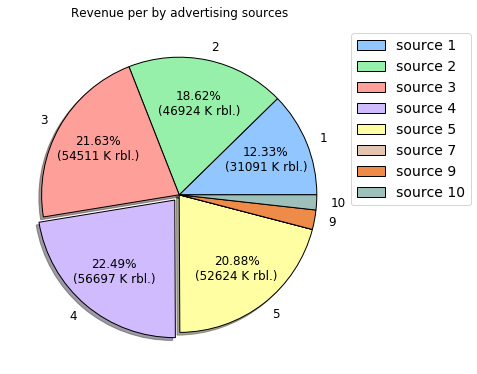

In [58]:
first_source_per_user = visits_sorted.groupby('uid').agg({'source id': 'first'})
rev_per_source = orders.merge(first_source_per_user, on='uid')
rev_per_source = rev_per_source.groupby('source id').agg({'revenue': 'sum'})

summary = rev_per_source.values.sum()
labels_for_legend = rev_per_source.index
labels_for_pie = [label if rev_per_source.loc[label].values[0] > 100 else '' for label in rev_per_source.index]

def func_pct(pct):
    if pct > 5:
        value = float(pct/100.*summary)
        return "{:.2f}%\n({:.0f} K rbl.)".format(pct, value)
    else:
        return ''

explode = (0, 0, 0, 0.05, 0, 0, 0, 0)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors.pop(-1)
colors.append('#E3C5B1')
colors.append('#EF8B49')
colors.append('#9EC0BA')

ax_pie = rev_per_source.plot(kind='pie', y='revenue', fontsize=12, use_index=False, shadow=True, explode=explode,
                        title = 'Revenue per by advertising sources', pctdistance=0.68, colors=colors,
                        wedgeprops={"edgecolor":"0",'linewidth': 1, 'linestyle': 'solid', 'antialiased': True},
                        figsize=(15,5), labels=labels_for_pie, autopct=lambda pct: func_pct(pct))

plt.tight_layout(pad=0)
legend_labels = list()
for label in labels_for_legend:
    legend_labels.append('source ' + str(label))

legend = ax_pie.legend(legend_labels, bbox_to_anchor=(0.98,0.99), prop={'size':14})
y_label = ax_pie.set_ylabel('')

The <b>2nd Channel</b> brought us the most revenue, followed by the <b>3rd</b>, <b>5th</b> and <b>2nd</b>.<br/> <br/>

In general, there is no direct relationship between advertising costs and the number of users involved/revenue.<br/> <br/>

Now we have to to display everything on a single graph to understand the effectiveness of each advertising channel clearly.

<a name="4.1.7."></a><br/>
<b>4.1.7. Costs, revenue, and number of attracted users by advertising sources</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

In [59]:
# покупатели по каналам
first_source_per_user = visits_sorted.groupby('uid').agg({'source id': 'first'})
client_per_source = orders.merge(first_source_per_user, on='uid')
client_per_source = client_per_source.groupby('source id').agg({'uid': 'nunique'})

rev_uid_costs_per_source = pd.concat([costs_per_source, rev_per_source, 
                                      uid_per_source, client_per_source],axis=1).fillna(0)
rev_uid_costs_per_source = rev_uid_costs_per_source.reset_index()
rev_uid_costs_per_source['index'] = 'source ' + rev_uid_costs_per_source['index'].astype('str')
rev_uid_costs_per_source = rev_uid_costs_per_source.set_index('index')
rev_uid_costs_per_source.columns = ['costs', 'revenue', 'uid', 'clients']


source = ColumnDataSource(data=rev_uid_costs_per_source)

p = figure(x_range=rev_uid_costs_per_source.index.values, 
           x_axis_label="Ad source", y_axis_label="K rbl. per person / prs. ",
           plot_width=950, plot_height=500, tools="tap, pan, wheel_zoom, reset",
           title="Costs, revenue, and number of attracted users by advertising sources.")

costs_bar = p.vbar(x=dodge('index', -0.25, range=p.x_range), top='costs', width=0.15, source=source,
color="#e84d60", legend_label="costs", line_color="black", nonselection_fill_alpha=0.2)

rev_bar = p.vbar(x=dodge('index', -0.1, range=p.x_range), top='revenue', width=0.15, source=source,
color="#83C2BA", legend_label="revenue", line_color="black")

users_bar = p.vbar(x=dodge('index', 0.05, range=p.x_range), top='uid', width=0.15, source=source,
color="#BE94DC", legend_label="visitors", line_color="black")

clients_bar = p.vbar(x=dodge('index', 0.2, range=p.x_range), top='clients', width=0.15, source=source,
color="#D79B11", legend_label="buyers", line_color="black")

p.legend.click_policy="hide"
p.add_tools(HoverTool(renderers=[costs_bar], tooltips=[("Costs", "@costs{1.0}")]))
p.add_tools(HoverTool(renderers=[users_bar], tooltips=[("Number of unique users", "@uid")]))
p.add_tools(HoverTool(renderers=[rev_bar], tooltips=[("Revenue", "@revenue{1.0}")]))
p.add_tools(HoverTool(renderers=[clients_bar], tooltips=[("Number of buyers", "@clients")]))
p.yaxis[0].formatter = NumeralTickFormatter(format='0,0')

p.xgrid.grid_line_color = None

p.ygrid.band_fill_alpha = 0.05
p.ygrid.band_fill_color = "navy"

p.xaxis.major_label_text_font_size = "11pt"
p.yaxis.major_label_text_font_size = "11pt"

show(p)

<a name="4.1.8."></a><br/>
<b>4.1.8. How much does is cost to attract one buyer from each source?</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Displaying info on the cost of attracting one client for each of the advertising channels:

In [60]:
rev_uid_costs_per_source['price_for_client'] = rev_uid_costs_per_source['costs']/rev_uid_costs_per_source['clients']
rev_uid_costs_per_source['price_for_client'] = rev_uid_costs_per_source['price_for_client'].round(2)
rev_uid_costs_per_source['price_for_client'].sort_values(ascending=False).to_frame()

,price_for_client
index,
source 3,13.49
source 2,12.21
source 5,7.47
source 1,7.19
source 4,5.93
source 9,5.07
source 10,4.38
source 7,0.00
source 6,NaN


This was predictable that <b>Channel 3</b> has the highest cost of attracting one user. <b>Channel 2</b> follows him, but at least it pays off unlike that <b>Channel 3</b>. And after them there are <b>Channel 4</b> and <b>5</b>.

<a name="4.1.9."></a><br/>
<b>4.1.9. Conclusions on the profitability of using each advertising source</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Conclusions about ad channels:
* <b>1st</b> and <b>2nd Channels</b> work really good: the revenue is bigger than costs, also they attract new clients. Not as many as <b>Sources 3</b> and <b>4</b>, but still these results correspond to the investmens in them;
* <b>Channels 5</b> and <b>9</b> don't give us any big profit, but they still work, attract new clients and don't make losses;
* <b>3rd Channel</b>, which has the biggest investments, is unprofitable - 44000 thousand rubles of revenue and 140000 thousand rubles of costs. Furthermore, it still isn't the first in number of new clients. The client who was attracted by that Channel is the most expensive for us;
* <b>4th Channel</b> is also unprofitable (revenue < costs), but it does great impact on the number of new clients and it's great considering that we made 2,5 less investments in it than in the <b>3rd Channel</b>;
* <b>6 and 7 Channels</b> don't have any costs (we don't make any investmens in them), we attracted 40 new users through them and 1 became our client (buyer) and did 1,22 thousand rubles of revenue for us;
* <b>10th Channel</b> makes a loss.
<br/><br/>
<font size="4"><b>Results:</b></font><br/> 
* <b>1st</b> and <b>2nd Channels</b> are the most promising in terms of revenue (they attract clients who make "big" orders);
* <b>4th Channel</b> is the most promising in terms of attracting new clients, but at the same time it doesn't pay off (at least within this 1 year-period);
* <b>3rd Channel</b> makes big loss to our company and still isn't top-1 in terms of new attracting new clients.<br/> <br/> 

In this regard, it's recommended to redistribute our investments in ad channels: a part from <b>3rd Channel</b> we should throw to the most perspectives <b>1st</b> and <b>2nd Channels</b>. It's necessary to find out, why users who are attracted by <b>4th Channel</b> don't make bigger orders than they do. Also we should make a research of <b>3rd Channel</b> in order to understand why we have so low conversion from user to buyer there and develop and take appropriate measures to improve these indicators.<br/> <br/> 

In conclusion, we can't say that our advertising policy is successful.

<a name="4.2."></a><br/>
<b>4.2. Resource attendance analysis by device type</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Let's take our <b>visits</b> dataFrame again:

In [61]:
visits.head()

,device,session_end,source id,session_start,uid,session_umd,session_week,session_month,session_duration
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20,51,2017-12,18
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19,8,2018-02,28
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01,26,2017-07,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-05-20,20,2018-05,24
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27,52,2017-12,0


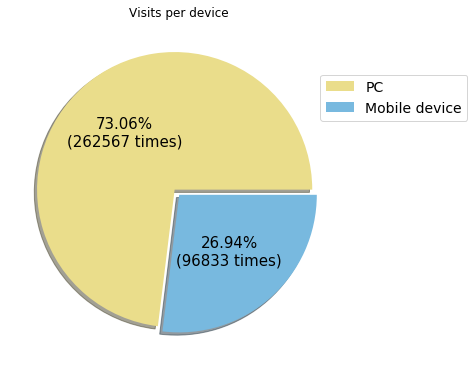

In [62]:
visits_by_device = visits.groupby('device').agg({'uid': 'count'})
summary = visits_by_device.values.sum()

def func_pct(pct):
    value = float(pct/100.*summary)
    return "{:.2f}%\n({:.0f} times)".format(pct, value)

explode = (0.05, 0)

ax_pie = visits_by_device.plot(kind='pie', y='uid', fontsize=15, use_index=False, shadow=True, explode=explode,
                        title = 'Visits per device', pctdistance=0.55, figsize=(15,5), 
                        autopct=lambda pct: func_pct(pct), colors=['#EADD8B', '#78B9DF'], labels=None)

plt.tight_layout(pad=0)

legend = ax_pie.legend(['PC', 'Mobile device'], bbox_to_anchor=(0.89,0.87), prop={'size':14})
y_label = ax_pie.set_ylabel('')

About 75% of visits to our site were made from a desktop PC. Given the current time, 25% of traffic from mobile devices is a quite weak. Probably the reason is the fact that there's no standalone <b>J.K.</b>'s application for mobile devices, and the site itself is not as convenient to use from a mobile device as from a personal computer.<br/> 

In the list of reasons for this distribution can be addded some specific feature of this market - it is much more convenient to choose a place in theater/cinema from a computer than from a phone. And it's more comfortable to make this kind of orders not on the fly, but sitting at home in a relaxed atmosphere.<br/>

It is necessary to test the mobile version of the site in terms of usability in order to establish whether it is the reason for the low rate of site traffic from mobile devices.

<a name="4.3."></a><br/>
<b>4.3. САС, ROMI</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Earlirt we've already formed a data frame with <b>LTV</b>, let's take it in order to calculate <b>CAC</b> and <b>ROMI (with margin_rate = 0.5 and 1)</b>:

<a name="4.3.1."></a><br/>
<b>4.3.1. Functions to plot heatmap and stacked-bar</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

In [63]:
# a function to create ROMI pivot table

def get_ROMI_pivot(LTV_pivot, margin_rate=0.5):
    LTV_copy = LTV_pivot.copy()
    costs_cac = costs.copy()
    costs_cac['date'] = costs_cac['date'].astype('datetime64[M]')

    all_costs = costs_cac.groupby('date')['costs'].sum().to_frame()

    final_cac = LTV_copy.merge(all_costs, left_on='first_purchase_date', right_on='date')
    final_cac['cac'] = final_cac['costs']/final_cac['n_buyers']
    final_cac['romi'] = final_cac['ltv']/final_cac['cac']

    romi_pivot = final_cac.pivot_table(index='first_purchase_date', columns='age',
                                       values='romi').round(2)

    romi_pivot_cumsum = romi_pivot.cumsum(axis=1).round(2)
    
    return romi_pivot, romi_pivot_cumsum

In [64]:
# a function to plot ROMI heatmap

def romi_heatmap(romi_pivot, margin_rate=0.5):
    romi_pivot_copy = romi_pivot.copy()

    romi_pivot_copy.loc[:, ''] = np.nan
    romi_pivot_copy.loc[:, 'Cumsum'] = romi_pivot_copy.sum(axis=1)
    romi_pivot_copy

    from matplotlib.colors import ListedColormap

    max_cumsum = romi_pivot_copy.loc[:, 'Cumsum'].max()
    max_in_each_column = np.max(romi_pivot_copy.iloc[:, :-1], axis=0)

    max_in_each_column

    plt.figure(figsize=(15,6))

    # common table (white background color)
    heatmap = sns.heatmap(romi_pivot_copy, fmt='.2f', annot=True, cmap=ListedColormap(['white']), 
                          vmax=0.5, linewidths=.5, cbar=False, 
                          mask=((romi_pivot_copy == max_cumsum) | (romi_pivot_copy == max_in_each_column)),
                          annot_kws={"size": '13'})

    # non-bold values
    heatmap = sns.heatmap(romi_pivot_copy.iloc[:, :-1], fmt='.2f', annot=True, cmap='YlGnBu', vmax=0.5, 
                          linewidths=.5,mask=romi_pivot_copy.iloc[:, :-1] == max_in_each_column, 
                          annot_kws={"size": '13'})

    # bold values
    heatmap = sns.heatmap(romi_pivot_copy.iloc[:, :-1], fmt='.2f', annot=True, cmap='YlGnBu', vmax=0.5,
                          linewidths=.5,mask=romi_pivot_copy.iloc[:, :-1] != max_in_each_column,
                          annot_kws={"weight": "bold", "size": '13'},
                          cbar=False)

    # bold cumsum-values 
    heatmap = sns.heatmap(romi_pivot_copy, fmt='.2f', annot=True, cmap=ListedColormap(['white']), 
                          vmax=0.5, linewidths=.5, cbar=False,
                          mask=romi_pivot_copy != max_cumsum,
                          annot_kws={"weight": "bold", "size": '13'})

    heatmap.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)

    heatmap.xaxis.set_label_position('top')
    heatmap.xaxis.labelpad = 15
    heatmap.yaxis.set_label_coords(-0.13, 0.57)
    y_labels = heatmap.set_yticklabels(romi_pivot_copy.index.date)
    heatmap.tick_params(length=0)
    title='ROMI (margin_rate={})'.format(margin_rate)
    title = plt.title(title, x=0.0, fontsize=20)

In [65]:
# a function to create stackedbar-plot

def romi_stacked_bar(romi_pivot, margin_rate=0.5):
    romi_stacked = romi_pivot.fillna(0).reset_index()
    romi_stacked['first_purchase_date'] = (romi_stacked['first_purchase_date']
                                           .apply(lambda x: str(x).split(' 00:00:00')[0])
                                          )
    romi_stacked['first_purchase_date'] = (romi_stacked['first_purchase_date']
                                           .apply(lambda x: str(x).split('-')[0] + '-' + str(x).split('-')[1])
                                          )
    romi_stacked = romi_stacked.rename(columns={'first_purchase_date': 'index'}).set_index('index')


    dates = romi_stacked.index.values.tolist()
    ages = [str(age) for age in romi_stacked.columns.values] 
    colors = ["#c9d9d3", "#718dbf", "#e84d60", 'skyblue', 'steelblue', 'blanchedalmond',
              'khaki', 'peru', 'lightgreen', 'plum', 'salmon', '#777E83']

    #data1
    data1 = {'index' : dates}
    for age in ages:
        data1[age] = romi_stacked[int(age)].tolist()
    
    columns_sum = romi_pivot.cumsum(axis=1).round(2)
    max_sum_per_col = columns_sum.max()
    max_sum = max_sum_per_col.max()
    if max_sum < 1:
        y_max = 1.2
    else:
        y_max = max_sum * 1.1
    
    p = figure(x_range=dates, plot_height=400, plot_width=750, 
               title="Contribution to final ROMI by age of cohort\n(margin_rate={})".format(margin_rate),
               y_range=(0, y_max), 
               tools="hover, wheel_zoom, pan, reset", tooltips="$name: @$name{1.11}")

    vbar = p.vbar_stack(ages, x='index', width=0.9, color=colors, source=data1, line_color="black")

    green_box = BoxAnnotation(bottom=1.0, fill_color='green', fill_alpha=0.1)
    p.add_layout(green_box)

    p.y_range.start = 0
    p.x_range.range_padding = 0.1
    p.xgrid.grid_line_color = None
    p.axis.minor_tick_line_color = None
    p.outline_line_color = None
    p.xaxis.major_label_orientation = 3.14/3.5

    p.xaxis.major_label_text_font_size = "11pt"
    p.yaxis.major_label_text_font_size = "11pt"

    legend = Legend(items=[(age, [part]) for (age, part) in zip(ages, vbar)], location=(0, 30))

    p.add_layout(legend, 'right')
    p.legend.click_policy="hide"

    show(p)

Forming pivot tables for <b>ROMI</b> for both 0.5 and 1 margin_rate:

In [66]:
romi_pivot_05, romi_pivot_cumsum_05 = get_ROMI_pivot(LTV_05, 0.5)
romi_pivot_1, romi_pivot_cumsum_1 = get_ROMI_pivot(LTV_1, 1)

<a name="4.3.2."></a><br/>
<b>4.3.2. ROMI (margin_rate = 0.5)</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Exploring <b>ROMI</b> (having <b>margin_rate = 0.5</b>):

Plotting:

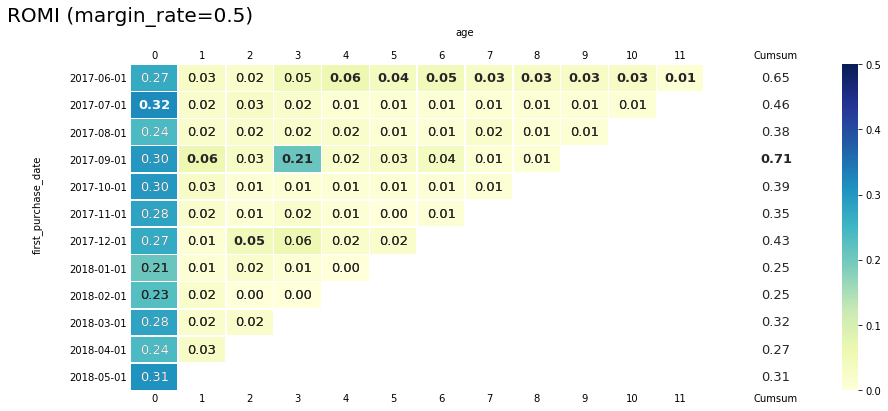

In [67]:
romi_heatmap(romi_pivot_05, margin_rate=0.5)

Visualising <b>ROMI (margin_rate=0.5)</b> using <b>stackedbar-plot</b>:

In [68]:
romi_stacked_bar(romi_pivot_05, margin_rate=0.5)

None of the cohorts reaches the green zone of <b>ROMI</b>, i.e. cumulative total does not exceed the value of 1.0.<br/>

It means that within this 1 year our business doesn't pay off. Considering the fact, that our <b>ROMI</b> grows only for 0.02 per month, it'll take long time even for the most perspective <b>1st</b> and <b>4th Cohorts</b> to reach this crucial 1.0 mark if we don't change anything in our business-approach.

<a name="4.3.3."></a><br/>
<b>4.3.3. ROMI (margin_rate = 1)</b>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

Now exploring <b>ROMI</b> (having <b>margin_rate = 1</b>):

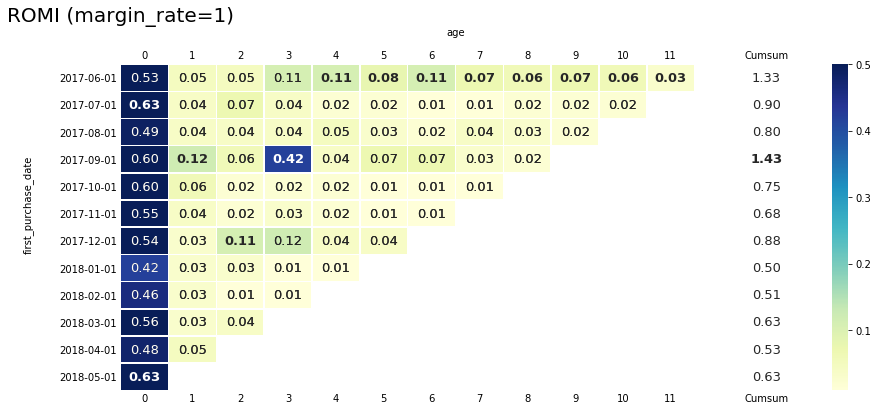

In [69]:
romi_heatmap(romi_pivot_1, margin_rate=1)

In [70]:
romi_stacked_bar(romi_pivot_1, margin_rate=1)

In this scenario <b>2 cohorts</b> (<b>1st</b> and <b>4th</b>) reached this "green zone" of payback.<br/><br/>

Nevertheless, if we take a loot at the 2nd half of cohorts, we'll see that their <b>ROMI-value</b> isn't even close to 1.0 mark. In view of the fact that these cohorts are twice more populated than cohorts of the first half, we can make a conclusion, that advertising campaigns became even less effective (people aren't ready to pay as many as first cohorts does) and, as a result, one client costs for us more than before.

<a name="5."></a><br/>
<font size="5"><b>5. General conclusion</b></font>.<br/>
<font size="2">([to the contents](#0.0))</font><br/>

<font size="4"><b>5.1. Product and Sales</b></font>.

<b>Retention</b> of our <b>J.K.</b> company is very low (about 4%). Most sessions last up to 2 minutes, i.e. people come and after making a couple of clicks, leave. Most customers do not return after their first purchase. The rest make 2 orders per month on average.<br/>
Nevertheless, there is one cohort, the <b>1st</b> one, which behaves unusually compared to all other cohorts: its <b>Retention</b> is noticeably higher than other cohorts have (6%), and they make more purchases per month (~4). It's necessary to carefully examine this cohort: how did they found our resource, what makes them continue to use it, why they choose <b>J.K.</b> among other ticket aggregators. It's also necessary to conduct a survey of clients from other cohorts in order to build an average profile of a client who makes much less purchases and who is less inclined to return to using <b>J.K.</b>. This will bring us closer to understanding what the difference is between a client from 1st and from any other cohort. Based on the data received, it will be possible to develop certain measures to increase loyalty among customers who use the site only once.<br/>

It should also be noted that thanks to an active advertising campaign from October 2017 to March 2018 (inclusively) the average number of one individual cohort increased noticeably in its zero month  (2 times: from 13,000 to 23,000 visitors). But at the same time, <b>Retention</b> hasn't changed in relative terms - the same ~ 4% of customers continue to use the resource.<br/>

<b>LTV</b> is 4 thousand rubles. <b>LTV</b> of <b>4th</b> and <b>1st</b> cohorts are slightly different from the average - 6.72 thousand rubles. and 5.94 thousand rubles. respectively.

<font size="4"><b>5.2. Marketing</b></font>.

It's necessary to redistribute investments in advertising channels and shift the focus from <b>channel 3</b>, which is especially unprofitable for the company, to <b>Channel 2</b> and <b>1</b>, which are quite promising. <b>Channels 3</b> and <b>4</b> should be researched deeper to find out the reasons for such a low conversion into a buyer and work out and then it's necessary carry out the necessary measures to fix the situation.

A special mention should be made of how users are "distributed" by device: 73% of visits are from PC, 27% from mobile devices. This is a pretty strong advantage in favor of a PC, especially considering current trends, when everything can be done via telephone. I assume that the main problem is that <b>J.K.</b> does not have a mobile application either in the <b>Play market</b> or in the <b>Apple Store</b>, and, to be honest, not each user can find it convenient to use the mobile version of the site through a mobile browser.<br/>

Given the situation on the market of big ticket aggregators, that none of them has a really good mobile application that big amout of people would actively use, it is worth making efforts to occupy this niche. A well-made mobile application can influence all indicators: from the duration of the session to <b>Retention</b>, and it can help us to take customers of such large aggregators as <b>Kassir</b> and <b>Bileter</b>, which everyone knows for a long time and many of use these services out of habit and because there's no another aggregator which could give us something new neither in terms of prices, nor in terms of ease of use. For example, push-notifications in our application for sending out promotional offers or notifications like "it's better to go out earlier since there's high traffic on your way" could significantly increase user loyalty and increase <b>Retention</b> and other important business indicators.

<b>ROMI</b> (with a margin coefficient of 0.5) did't reach the "green" zone in any cohort (value > 1). It says to us that the business, in its current form, is unprofitable. As already mentioned above, it's necessary to revise the advertising policy of the company, it's also necessary to study the behavior of customers who stay longer and buy more often than others, and we need to look in the direction of developing a mobile application that, finally, would give to all of our potential customers to buy tickets on-the-go with comfort.

We can't keep doing business this way. We have enough data now to create a new development strategy.
First of all, we need to do all necessary researches, formulate new strategy and then apply it to our business.

<hr />
<html>
<head>
    <title>Title of the document</title>
    <style>
      table, th, td {
      padding: 10px;
      border: 1px solid black; 
      border-collapse: collapse;
      }
    </style>
  </head>
<body>
<table border="1" cellspacing="0" cellpadding="0">
<tr>
<td><b>Date</b></td>
<td><b>Revenue, K rbl.</b></td>
<td><b>Costs,<br/> K rbl.</b></td>
<td><b>Profit, K rbl.</b></td>
<td><b>Avg check, K rbl.</b></td>
<td><b>Number of orders</b></td>
<td><b>Number of unique ids, prs.</b></td>
<td><font size="3"><b>Conclusion</b></font></td>   
</tr>
<tr>
<td> <b>8 June 2017</b></td>
<td>444<span style="color:green">&#x2796;</span></td>
<td>1354<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-910</b></font></td>
<td>2<span>&#x2796;</span></td>
<td>181<span style="color:green">&#x25B2;</span></td>
<td>868<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Advertising campaign helped us to increase the number of orders but it was not enough to seriously increase profits because average check was pretty low.</font></td>
</tr>
<tr>
<td> <b>14 July 2017</b></td>
<td>737<span style="color:green">&#x2796;</span></td>
<td>1328<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-591</b></font></td>
<td>5<span>&#x2796;</span></td>
<td>138<span>&#x2796;</span></td>
<td>839<span style="color:green">&#x25B2;</span></td>
<td><font size="3">The effect of advertising had not met the expectations. The number of visitors has increased but they did not start to buy more.</font></td>
</tr>
<tr>
<td> <b>17 July 2017</b></td>
<td>1759<span style="color:green">&#x25B2;</span></td>
<td>1155<span style="color:red">&#x25B2;</span></td>
<td><font color=green><b>604</b></font></td>
<td>8<span>&#x25B2;</span> </td>
<td>225<span>&#x25B2;</span> </td>
<td>1138<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Advertising campaign was successfil. Revenue increased due to increased number of clients and, therefore, number of orders and average value of check.</font></td>
</tr>
<tr>
<td> <b>6 October 2017</b></td>
<td>1350<span style="color:green">&#x2796;</span></td>
<td>1758<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-408</b></font></td>
<td>4<span>&#x25BC;</span> </td>
<td>371<span>&#x25B2;</span> </td>
<td>1418<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Advertisement increased the number of orders, but average check was quite low to provide sufficient revenue, that's why we have a loss. Probably there were some not big activities that's why prices were low.</font></td>
</tr>
<tr>
<td> <b>27 October 2017</b></td>
<td>893<span style="color:red">&#x25BC;</span></td>
<td>1739<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-846</b></font></td>
<td>5<span>&#x2796;</span></td>
<td>188<span>&#x2796;</span></td>
<td>1187<span style="color:green">&#x2796;</span></td>
<td><font size="3">Ad campaign didn't change any indicators. It should be reviewed.</font></td>
</tr>
<tr>
<td> <b>16 November 2017</b></td>
<td>1916<span style="color:green">&#x25B2;</span></td>
<td>1811<span style="color:red">&#x25B2;</span></td>
<td><font color=green><b>105</b></font></td>
<td>8<span>&#x25B2;</span>  </td>
<td>254<span>&#x25B2;</span>  </td>
<td>1604<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Quite small, but still successful advertising campaign.</font></td>
</tr>
<tr>
<td> <b>24 November 2017</b></td>
<td>3398<span style="color:green">&#x25B2;</span><span style="color:green">&#x25B2;</span></td>
<td>3459<span style="color:red">&#x25B2;</span><span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-61</b></font></td>
<td>4<span>&#x2796;</span></td>
<td>814<span>&#x25B2;</span><span>&#x25B2;</span></td>
<td>3319<span style="color:green">&#x25B2;</span><span style="color:green">&#x25B2;</span></td>
<td><font size="3">Advertising campaign with the biggest for the entire annual period. It increased the number of orders several times, but still it made zero profit in terms of finance.</font></td>
</tr>
<tr>
<td> <b>10 December 2017</b></td>
<td>4661<span style="color:green">&#x25B2;</span></td>
<td>1071<span style="color:green">&#x2796;</span></td>
<td><font color=green><b>3590</b></font></td>
<td>29<span>&#x25B2;</span><span>&#x25B2;</span></td>
<td>160<span>&#x2796;</span></td>
<td>1130<span style="color:red">&#x25BC;</span></td>
<td><font size="3">The most successful day for the company this year in terms of effectiveness of advertisement and profit. Average costs (compared to nearby periods) haven't changed, in other words, no "aggressive investments" were made in advertising, but revenue grew considerably. And the amount of the average check increased almost sixfold (comparing to to the average value of 5 thousand rubles). Perhaps some big of world band group arrived and people were buying tickets not one at a time, that's why we have such a high average amount per check.</font></td>
</tr>
<tr>
<td> <b>11 December 2017</b></td>
<td>1018<span style="color:red">&#x25BC;</span></td>
<td>2121<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-1103</b></font></td>
<td>5<span>&#x2796;</span></td>
<td>209<span>&#x2796;</span></td>
<td>1505<span style="color:green">&#x25B2;</span></td>
<td><font size="3">Investments were made in advertising (Source 3) immediately after a successful day, apparently we thought that it's going to pay off more, and this costed the company financial losses, because this campaign had no effect on sales.</font></td>
</tr>
<tr>
<td> <b>10 February 2018</b></td>
<td>1071<span style="color:red">&#x25BC;</span></td>
<td>1981<span style="color:red">&#x25B2;</span></td>
<td><font color=red><b>-910</b></font></td>
<td>4<span>&#x2796;</span></td>
<td>244<span>&#x2796;</span></td>
<td>1189<span style="color:green">&#x2796;</span></td>
<td><font size="3">Advertisement with "regular" investment campaign. Without the desired effect. Made a loss.</font></td>
</tr>
<tr>
<td> <b>30-31 March 2018</b></td>
<td>50<span style="color:red">&#x25BC;</span><span style="color:red">&#x25BC;</span></td>
<td>15<span style="color:green">&#x25BC;</span><span style="color:green">&#x25BC;</span></td>
<td>35</td>
<td>2<span>&#x25BC;</span> </td>
<td>8<span>&#x25BC;</span><span>&#x25BC;</span> </td>
<td>60<span style="color:red">&#x25BC;</span><span style="color:red">&#x25BC;</span></td>
<td><font size="3">All indicators dropped down drastically. Perhaps within 1 (or a little more) day the website was unavailable to users or all the tags with which we tracks our crucial values stopped working. It is necessary contact our technival service to find out the reasons this weird behaviour.</font></td>
</tr>
<tr>
<td> <b>31 May 2018</b></td>
<td>4614<span style="color:green">&#x25B2;</span></td>
<td>2154<span style="color:red">&#x25B2;</span></td>
<td><font color=green><b>2460</b></font></td>
<td>8<span>&#x25B2;</span></td>
<td>610<span>&#x25B2;</span><span>&#x25B2;</span></td>
<td>1997<span style="color:green">&#x25B2;</span></td>
<td><font size="3">The second most successful advertising company. Big investments (in all advertising Channels), but it paid off with a margin. The average check and the number of orders grown significantly on this day, which allowed us to make good revenue.</font></td>
</tr>
</table>
</body>
</html>
<hr />